In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

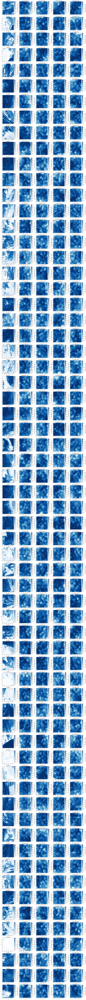

In [2]:
gen = xr.open_dataset('data/samples/gen.nc')
real = xr.open_dataset('data/samples/real.nc')

STYLES = {
    "logBlues": {"cmap": "Blues", "norm": matplotlib.colors.LogNorm()}
}

def plot_map(da, ax, title = "", style = "Blues", add_colorbar=False, **kwargs):
    if style is not None:
        kwargs = {**STYLES[style], **kwargs}

    pcm = da.plot.pcolormesh(ax = ax, **kwargs)

    ax.set_title(title)

    return pcm

fig, axs = plt.subplots(ncols=5, nrows = 64, figsize = (24, 300))

for i in range(64):
    plot_map(real["__xarray_dataarray_variable__"][i] * 3600 * 24, axs[i][0], style="logBlues", add_colorbar=True)
    axs[i][0].set_title("Real Data")

    for j in range(4):
        plot_map(gen['__xarray_dataarray_variable__'][i][j] * 3600 * 24, axs[i][j+1], style = "logBlues", add_colorbar=True)
        axs[i][j+1].set_title("Generated " + str(j + 1) + " Data")

plt.show()

In [29]:
ds = xr.open_dataset('data/val.nc')
ds

<xarray.Dataset>
Dimensions:                     (time: 4320, grid_latitude: 64,
                                 grid_longitude: 64, bnds: 2)
Coordinates:
  * time                        (time) object 1980-12-03 12:00:00 ... 2080-11...
  * grid_longitude              (grid_longitude) float32 357.9 358.0 ... 363.0
  * grid_latitude               (grid_latitude) float32 -2.49 -2.41 ... 2.55
    season                      (time) int64 ...
Dimensions without coordinates: bnds
Data variables: (12/16)
    psl                         (time, grid_latitude, grid_longitude) float32 ...
    rotated_latitude_longitude  (time) float64 ...
    grid_latitude_bnds          (time, grid_latitude, bnds) float32 ...
    grid_longitude_bnds         (time, grid_longitude, bnds) float32 ...
    time_bnds                   (time, bnds) object ...
    target_pr                   (time, grid_latitude, grid_longitude) float32 ...
    ...                          ...
    temp925                     (time, grid_latitude, grid_longitude) float32 ...
    vorticity250                (time, grid_latitude, grid_longitude) float64 ...
    vorticity500                (time, grid_latitude, grid_longitude) float64 ...
    vorticity700                (time, grid_latitude, grid_longitude) float64 ...
    vorticity850                (time, grid_latitude, grid_longitude) float64 ...
    vorticity925                (time, grid_latitude, grid_longitude) float64 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.5 (https://mpimet.mpg.de...
    Conventions:  CF-1.7
    source:       Data from Met Office Unified Model
    um_version:   10.6
    CDO:          Climate Data Operators version 2.0.5 (https://mpimet.mpg.de...

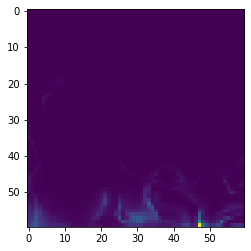

In [3]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')
plt.imshow(gen["__xarray_dataarray_variable__"][0][3])
plt.show()

0


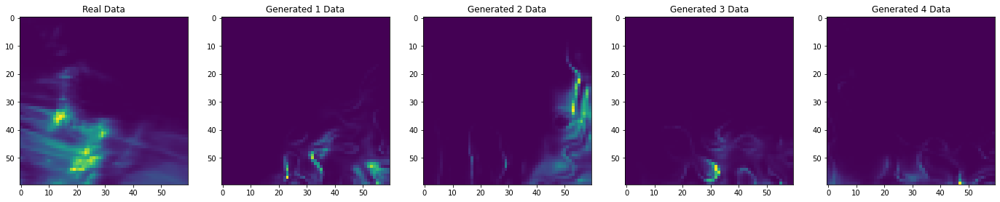

1


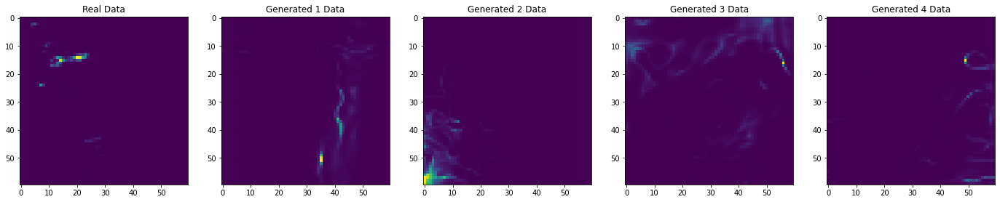

2


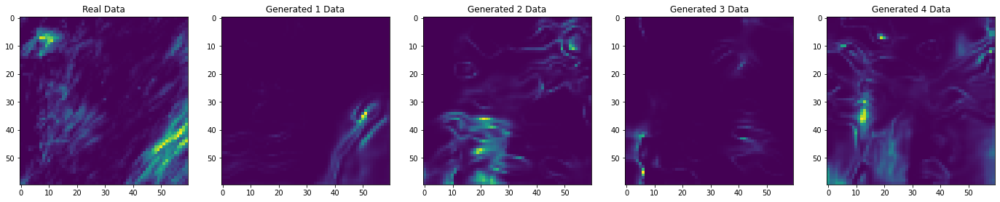

3


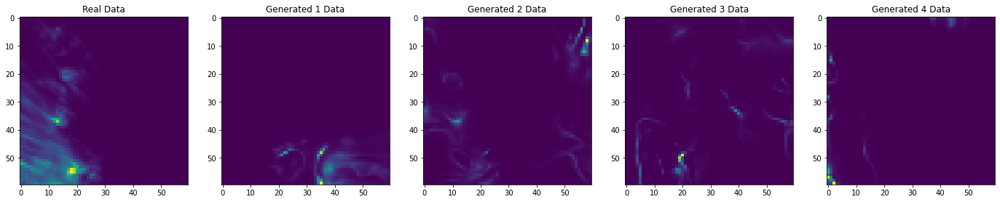

4


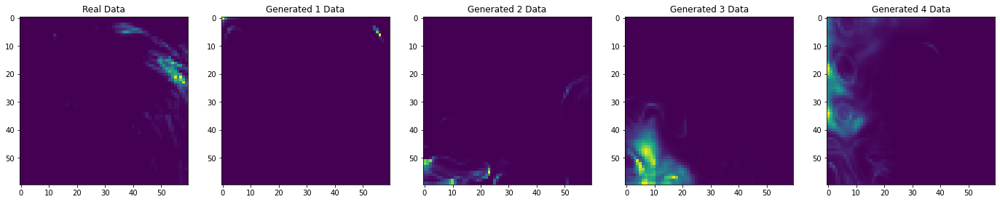

5


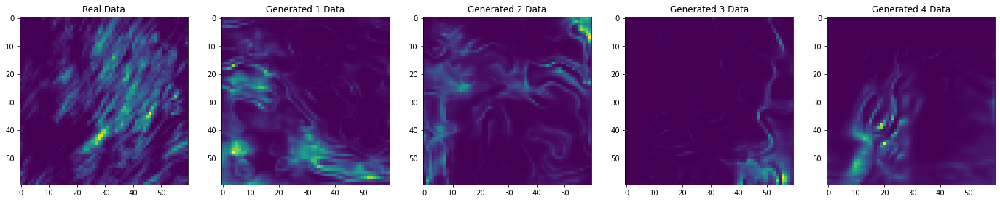

6


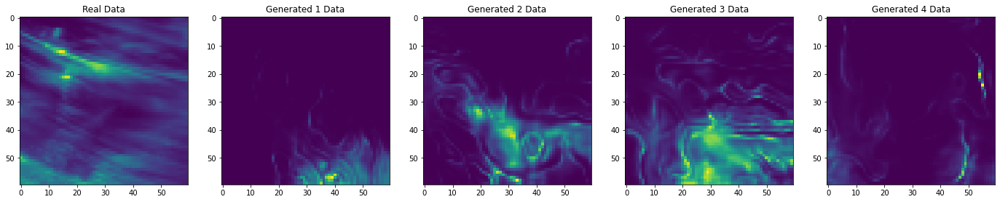

7


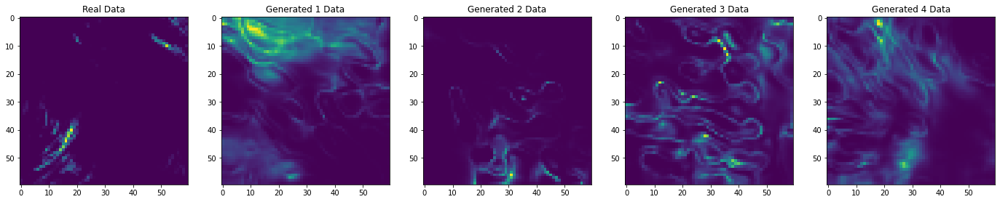

8


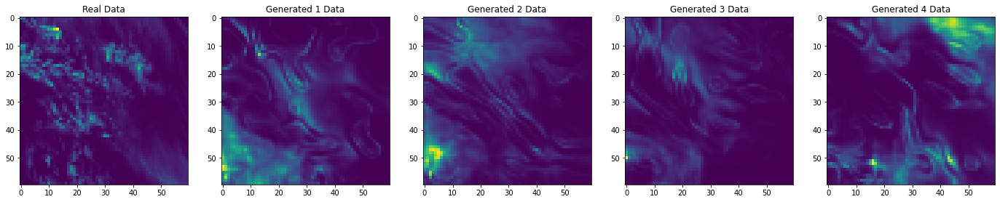

9


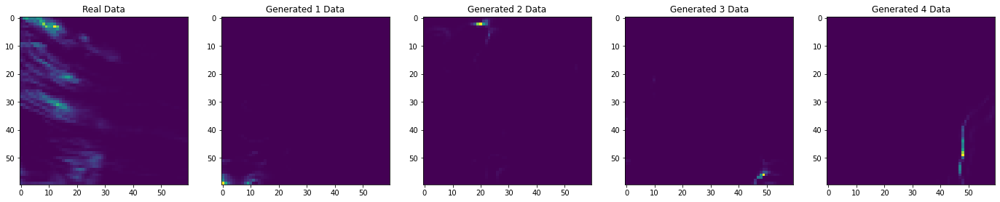

10


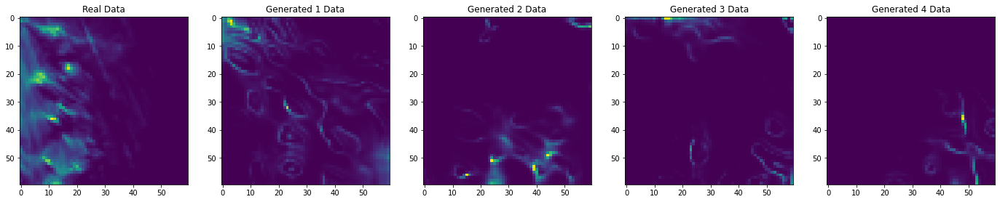

11


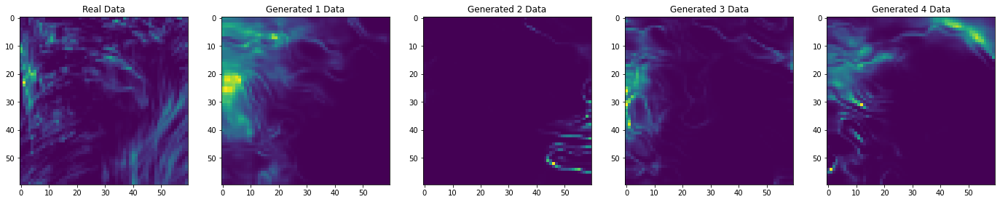

12


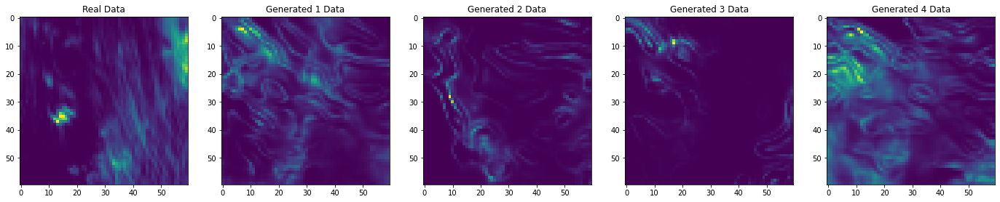

13


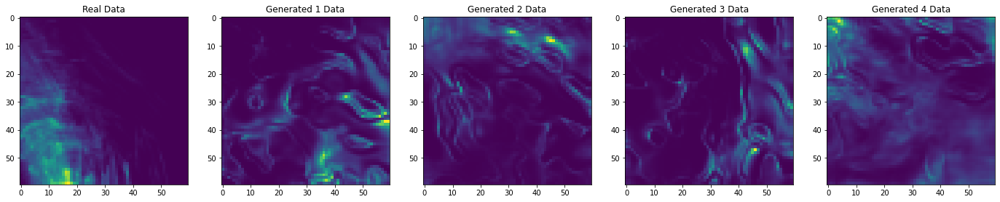

14


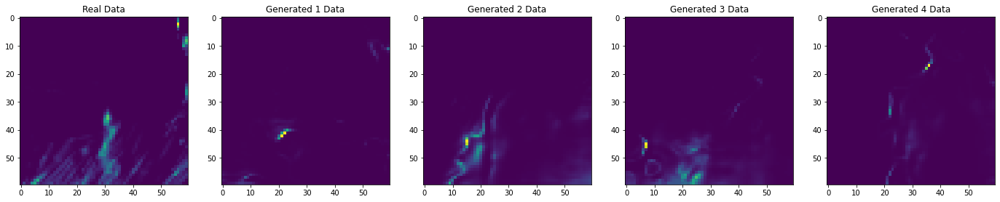

15


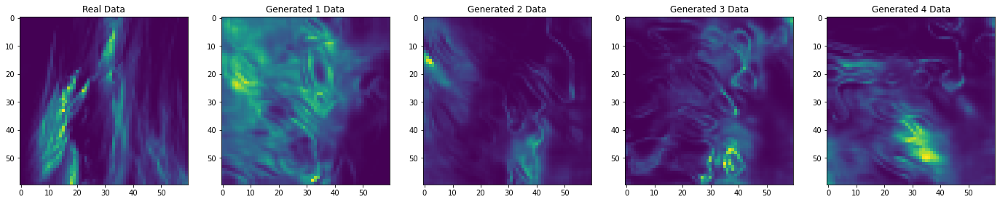

16


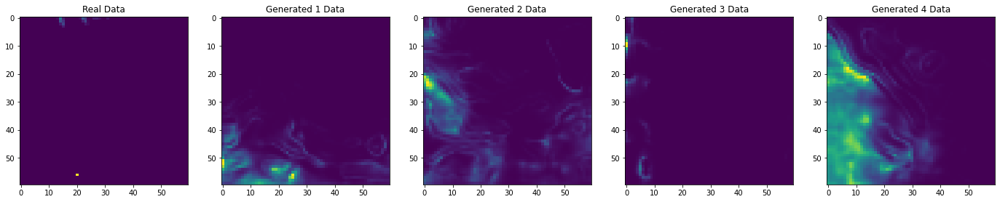

17


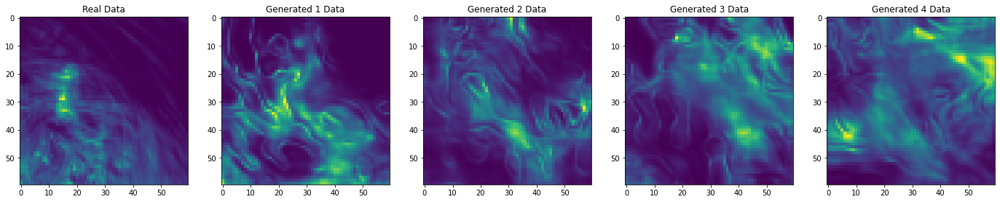

18


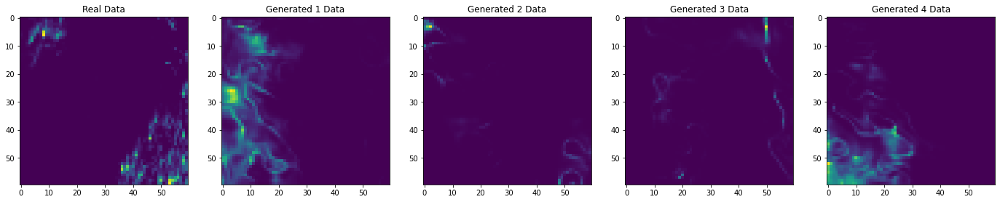

19


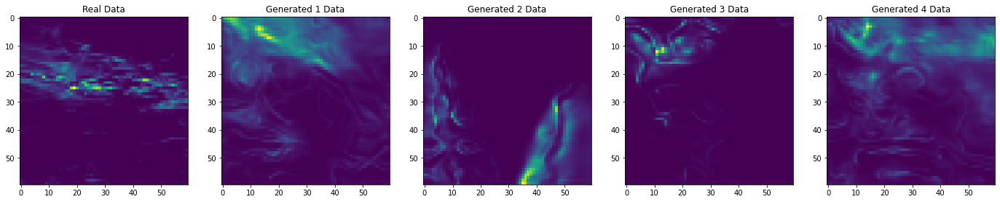

20


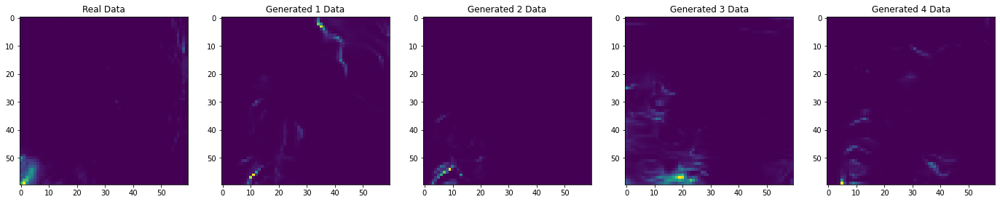

21


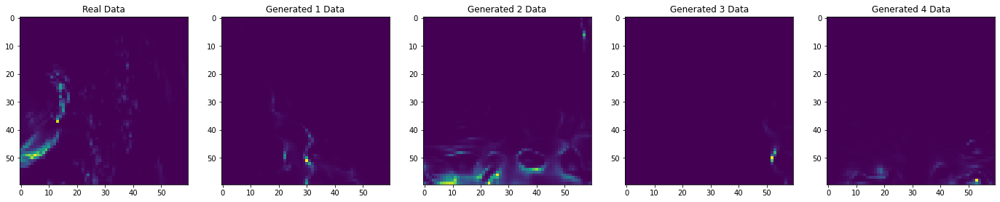

22


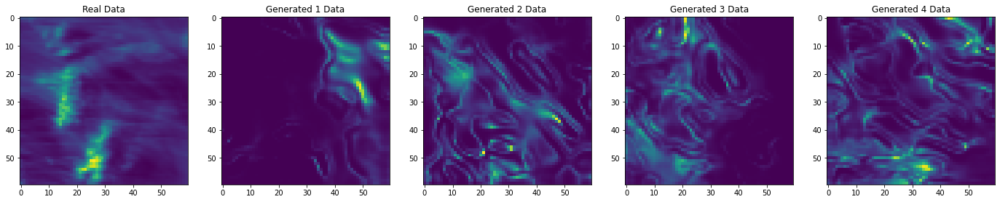

23


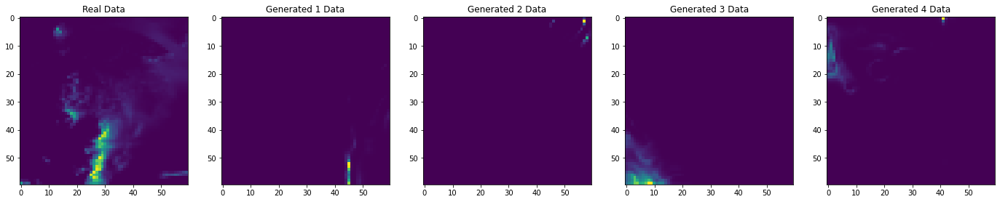

24


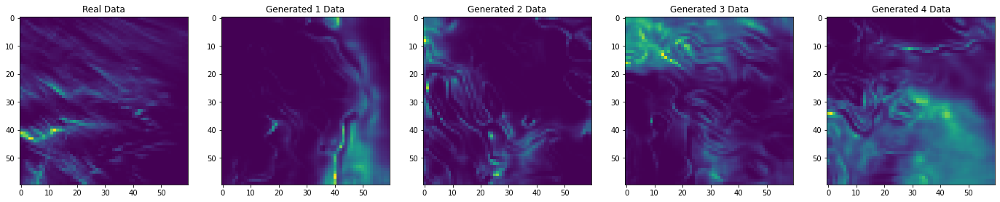

25


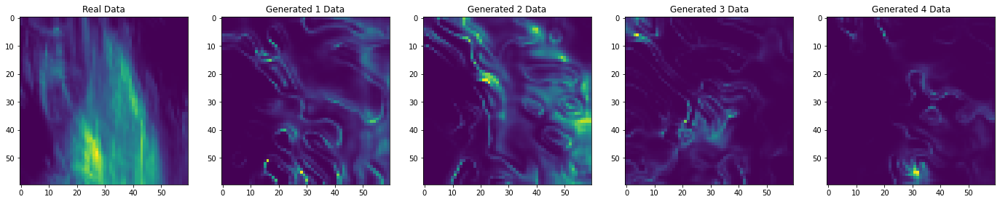

26


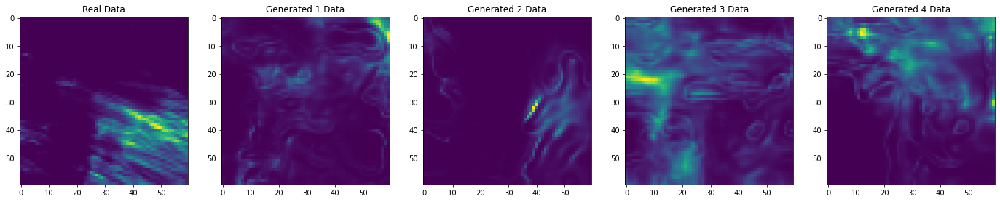

27


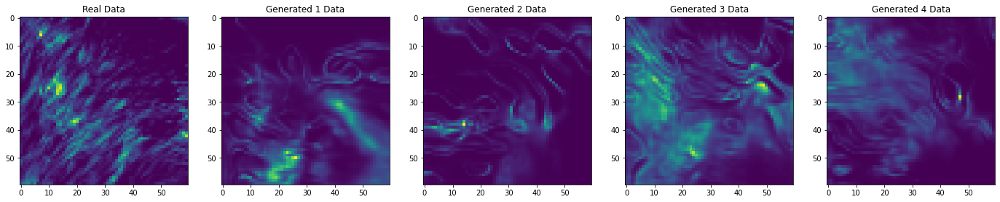

28


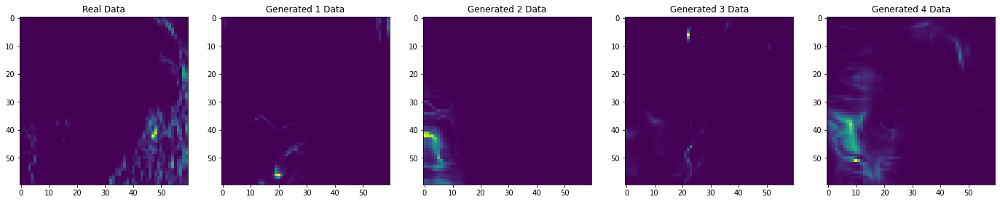

29


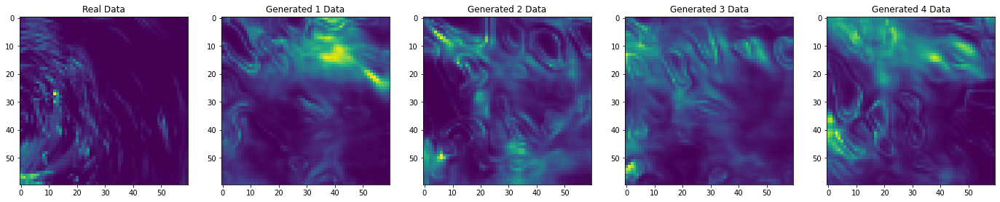

30


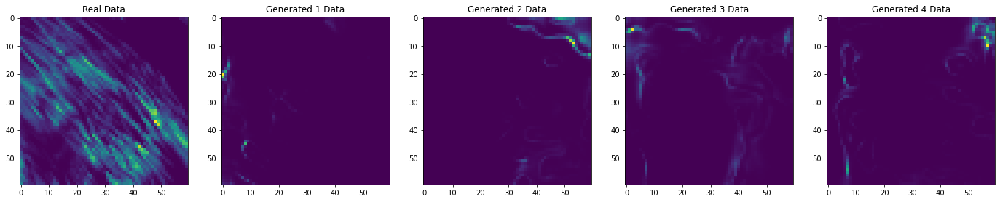

31


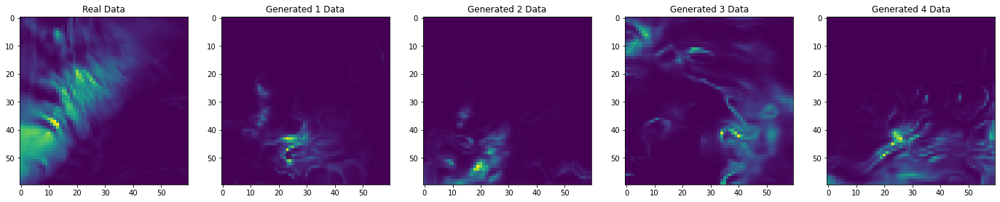

32


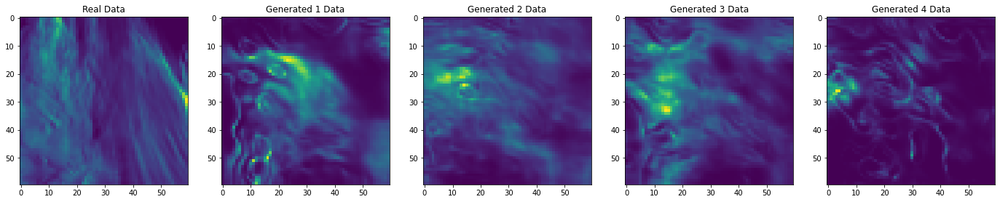

33


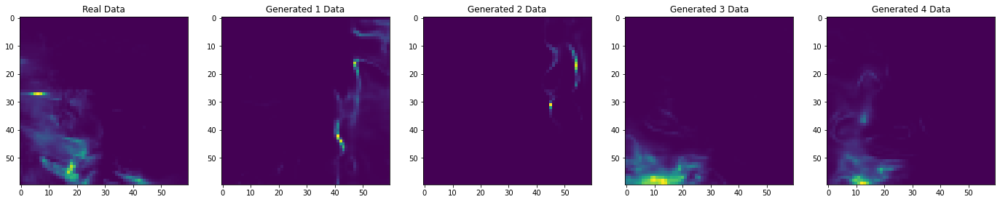

34


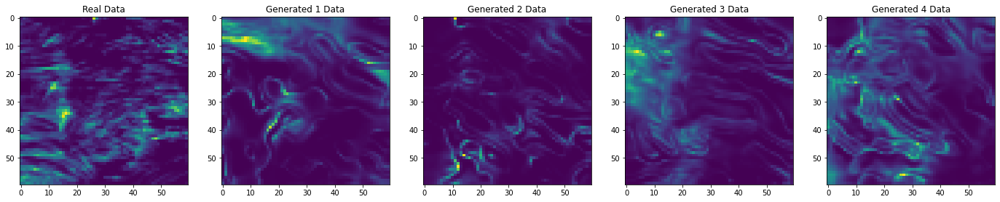

35


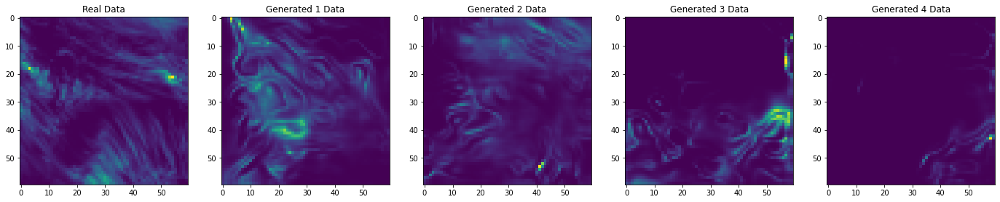

36


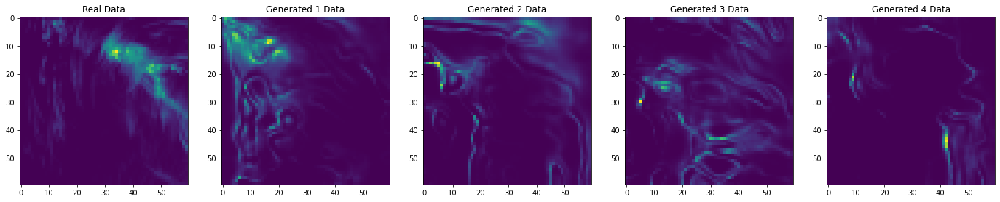

37


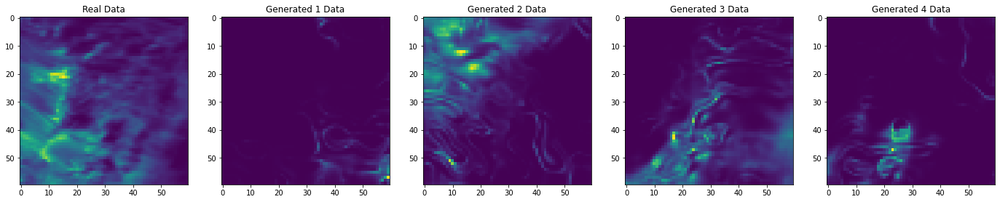

38


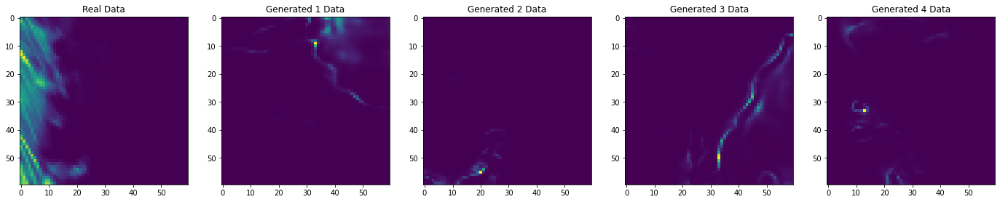

39


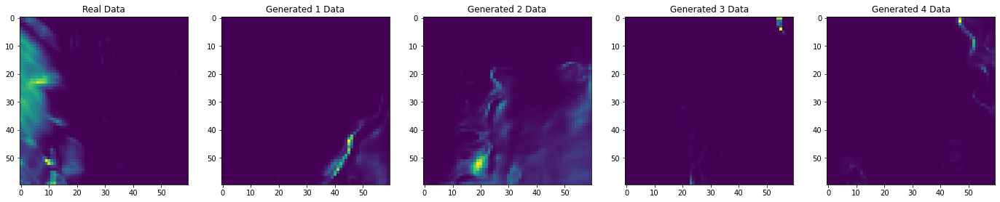

40


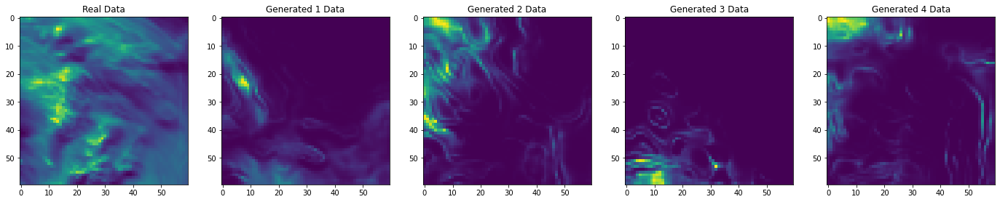

41


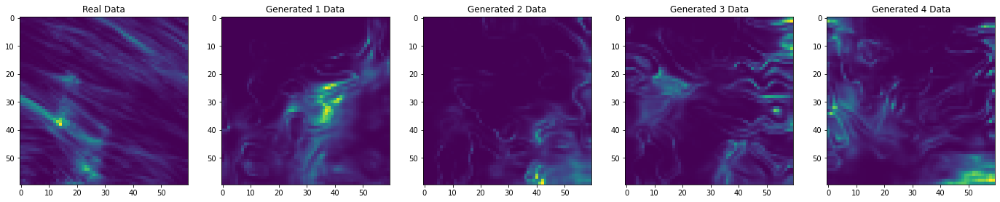

42


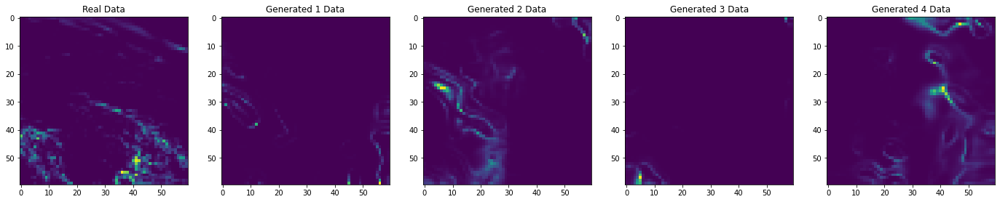

43


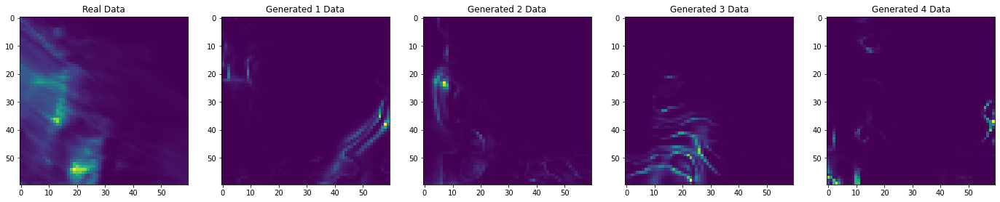

44


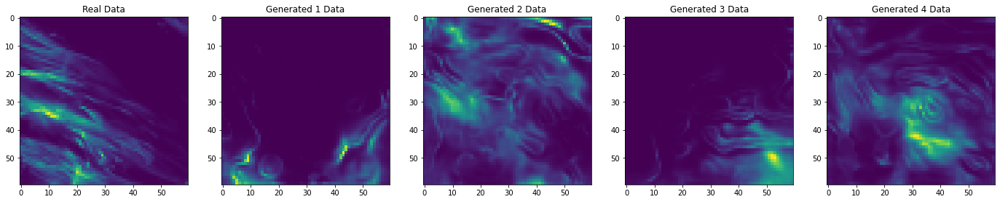

45


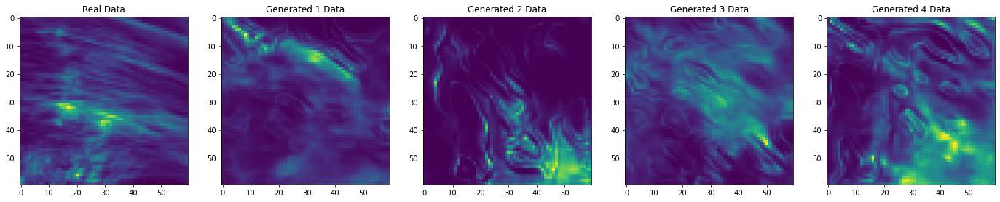

46


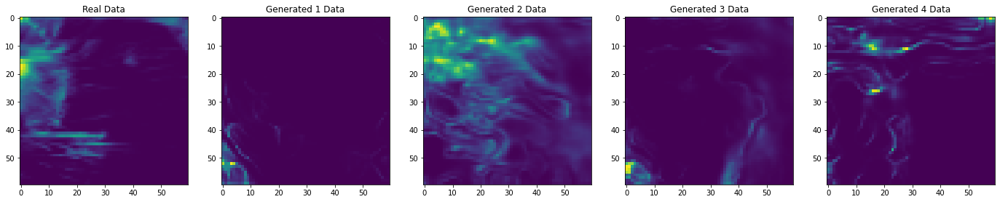

47


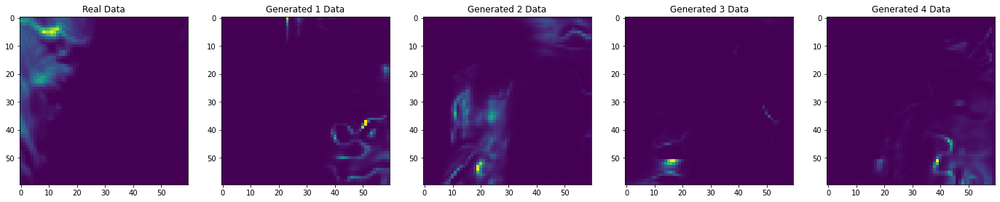

48


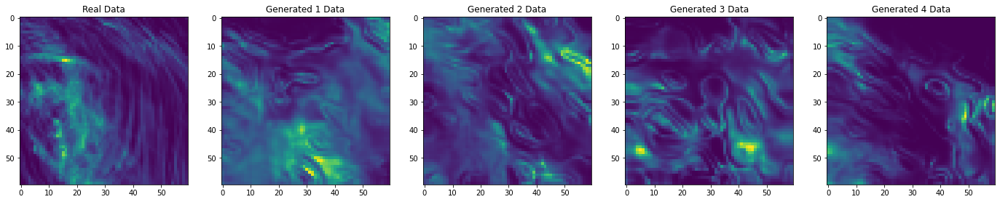

49


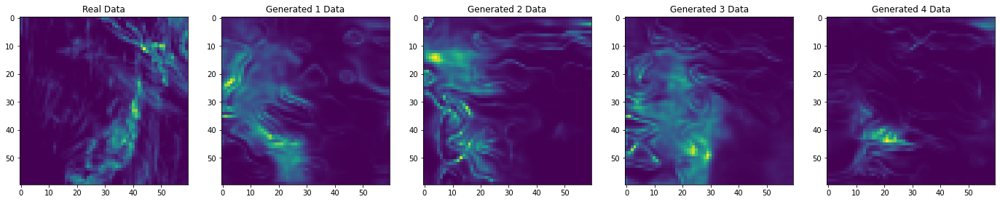

50


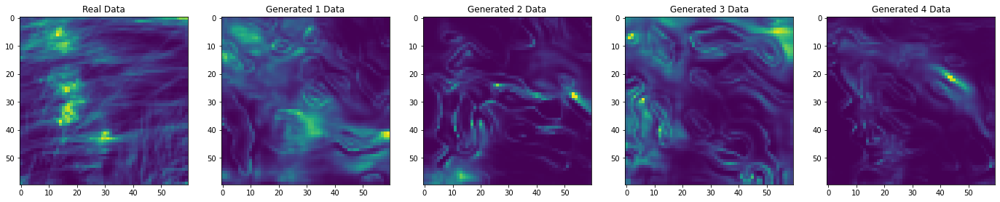

51


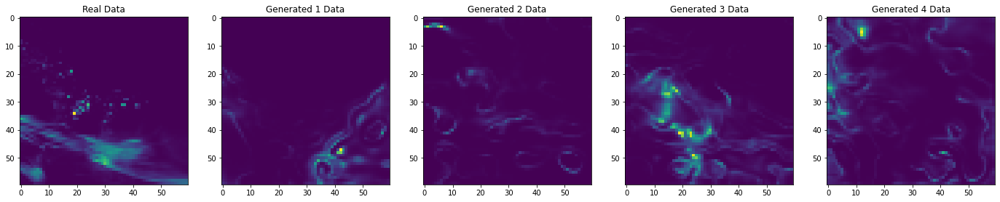

52


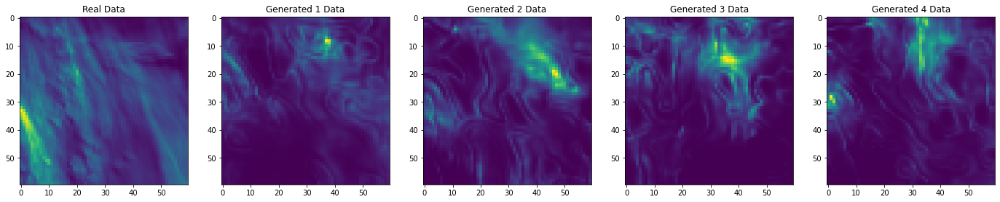

53


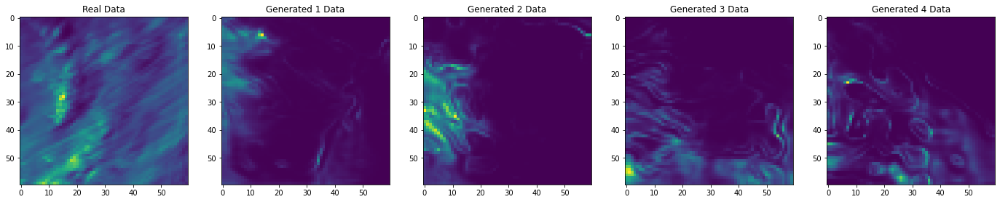

54


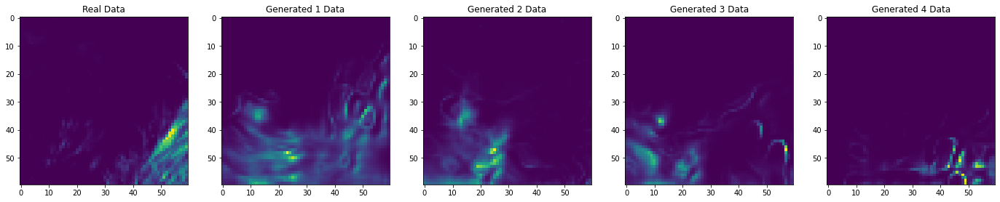

55


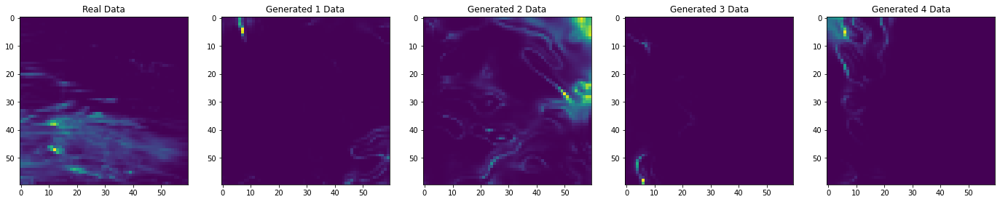

56


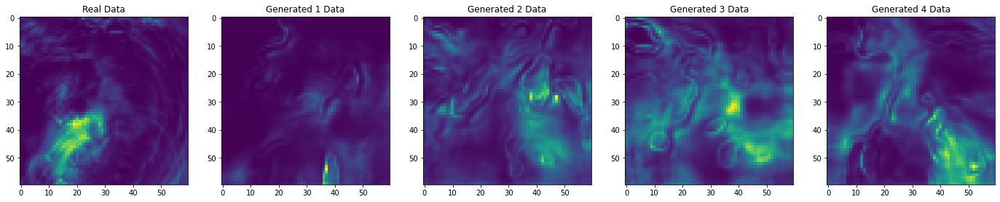

57


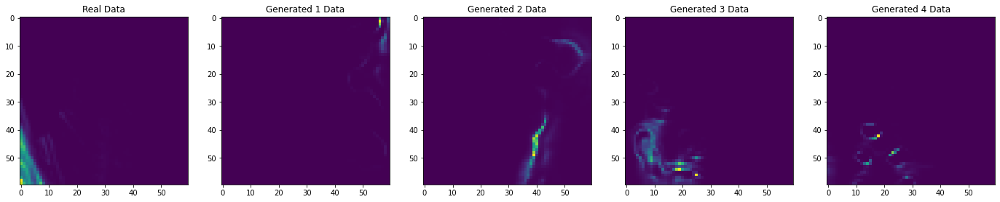

58


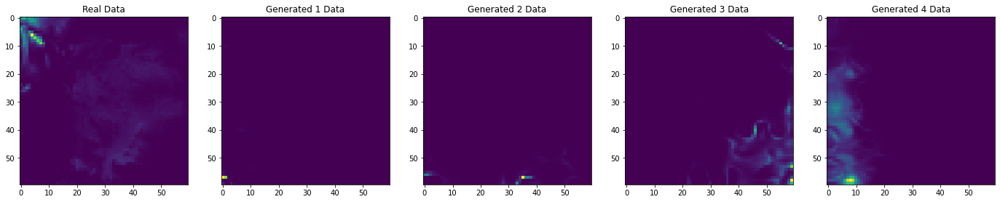

59


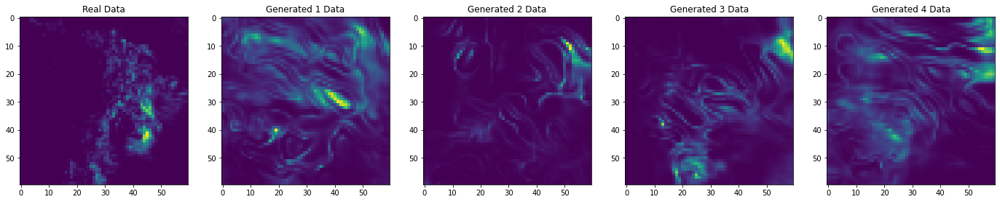

60


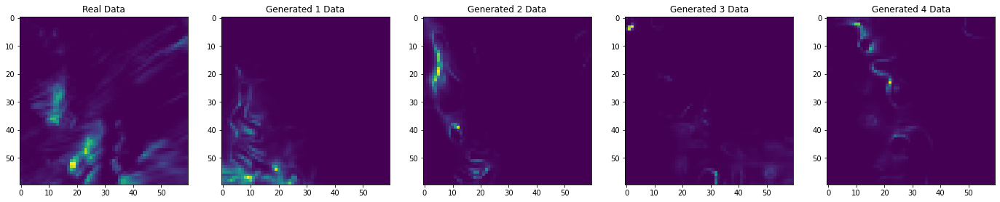

61


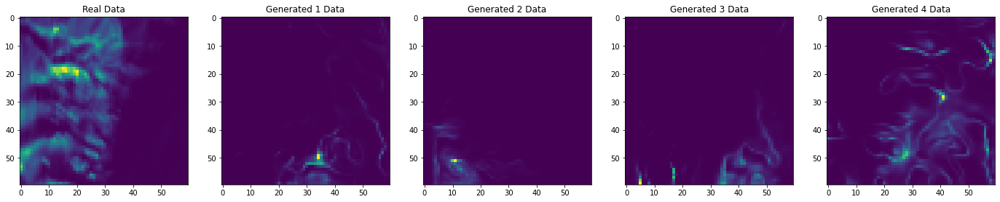

62


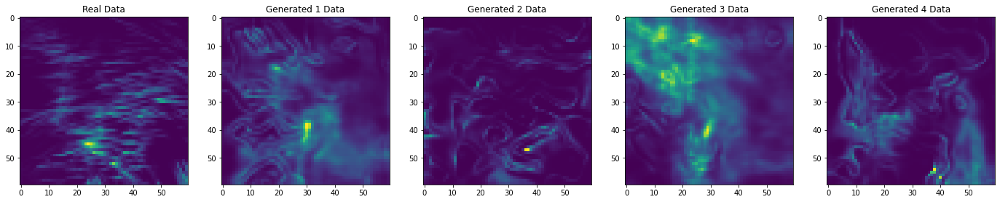

63


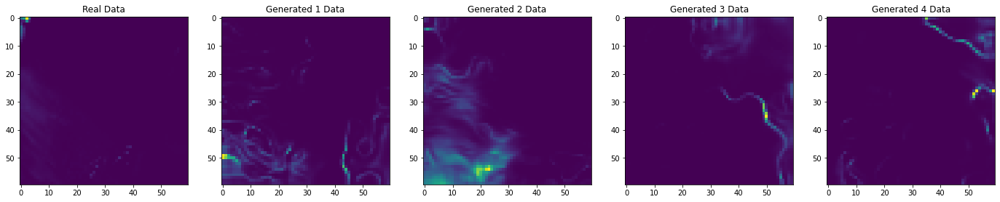

64


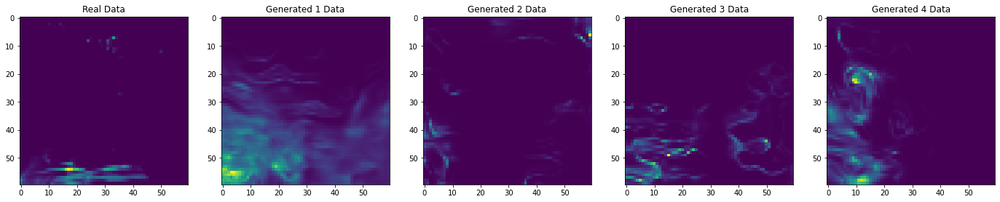

65


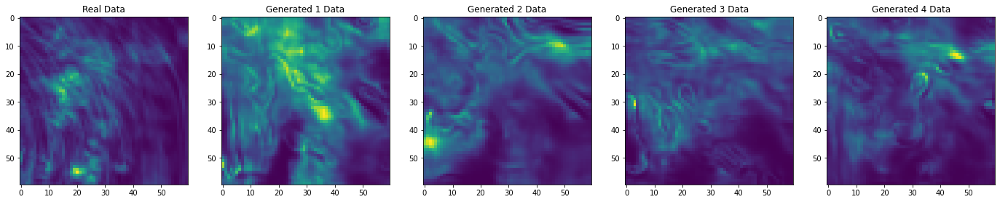

66


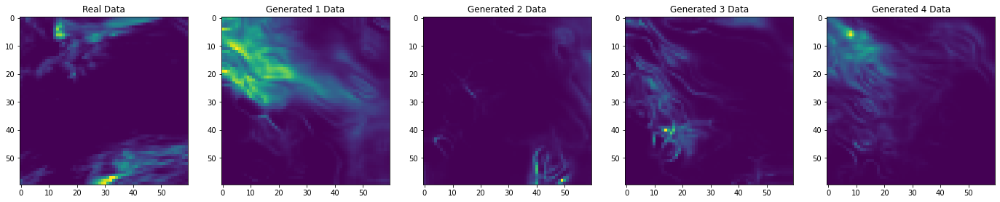

67


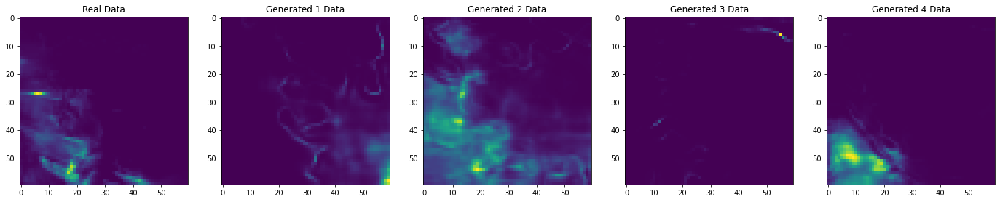

68


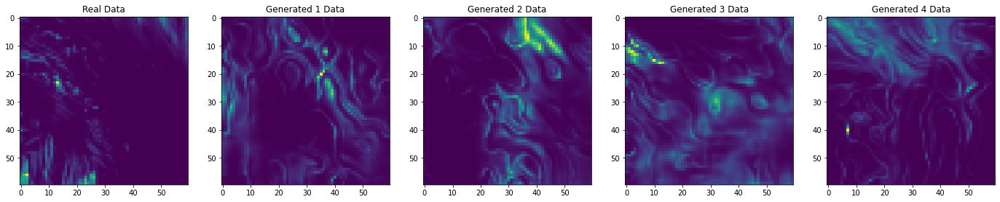

69


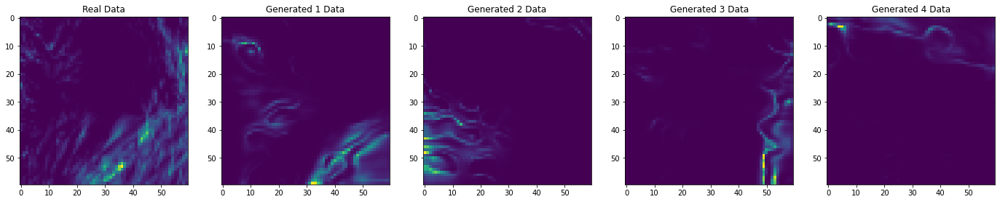

70


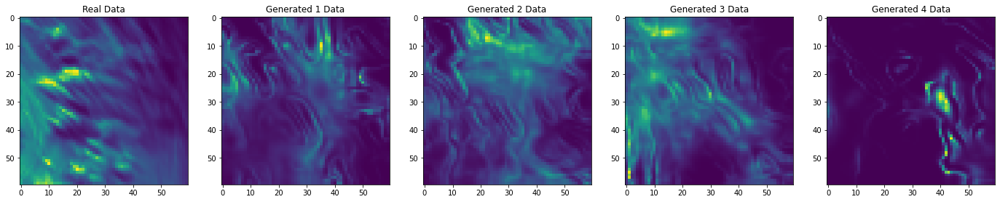

71


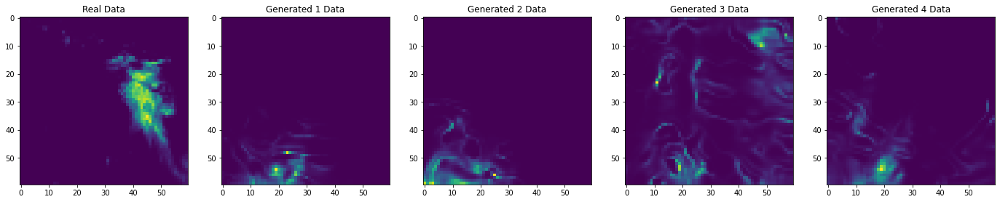

72


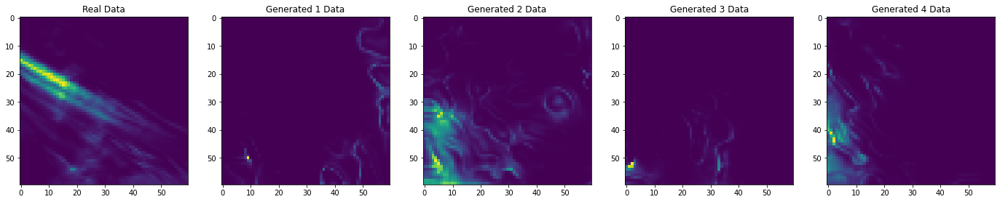

73


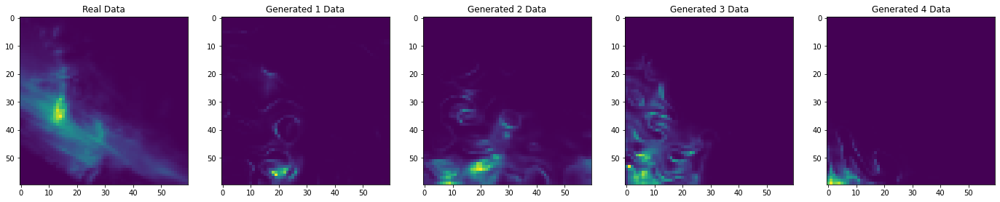

74


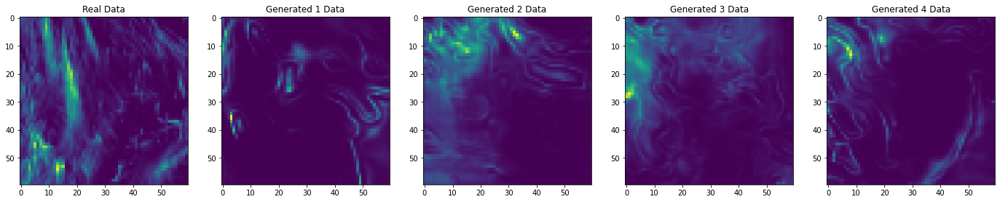

75


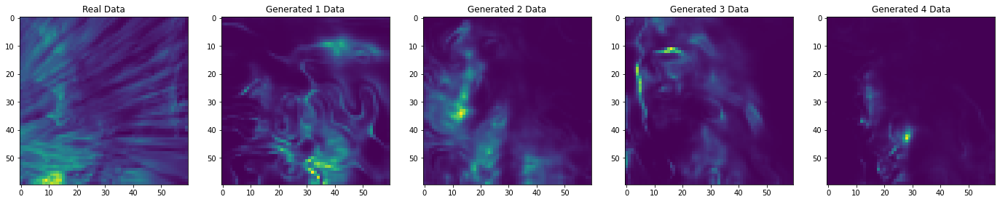

76


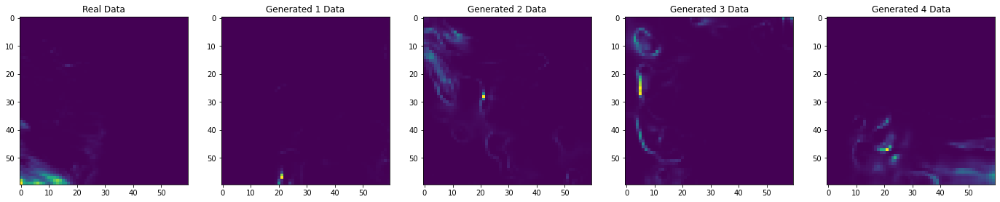

77


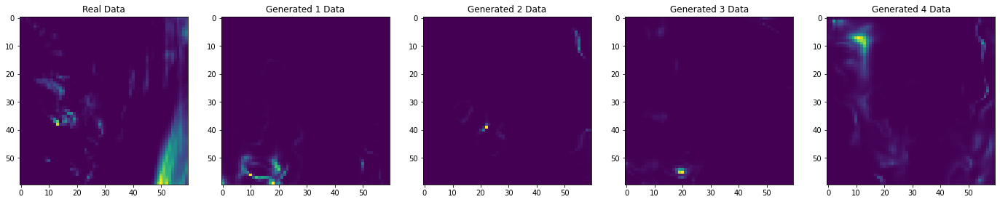

78


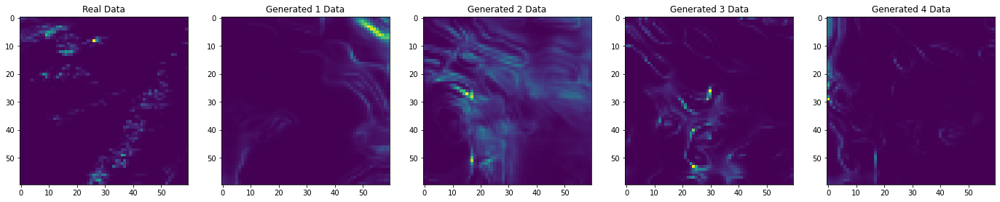

79


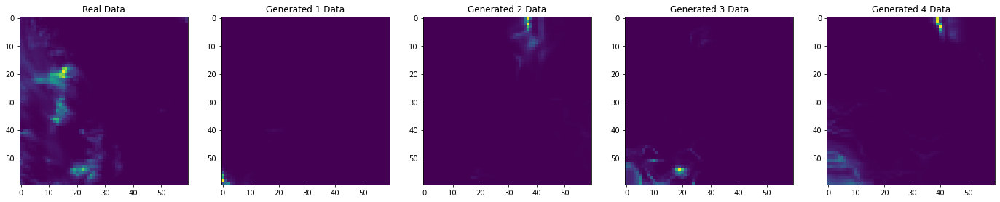

80


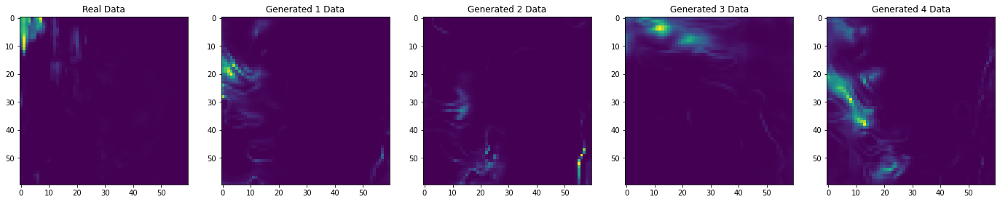

81


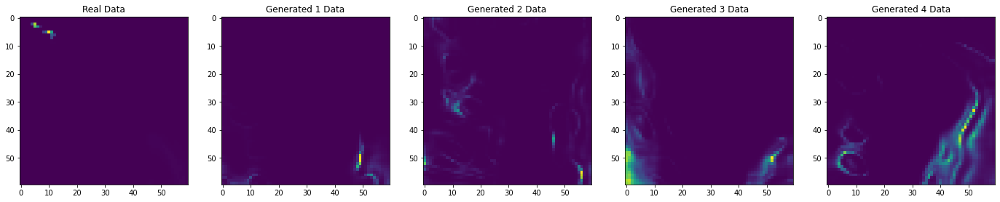

82


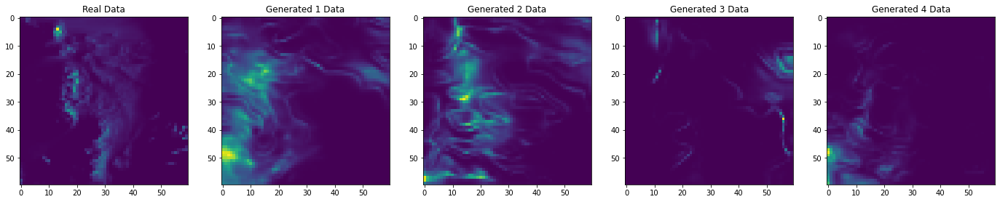

83


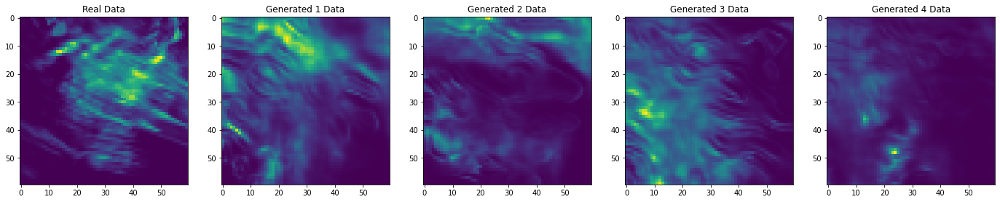

84


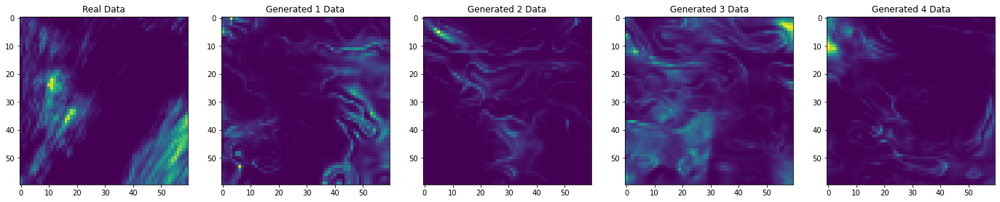

85


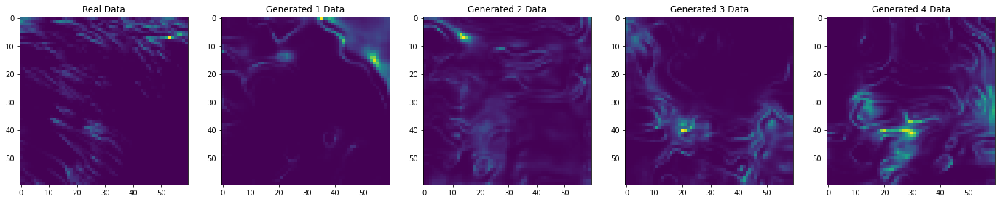

86


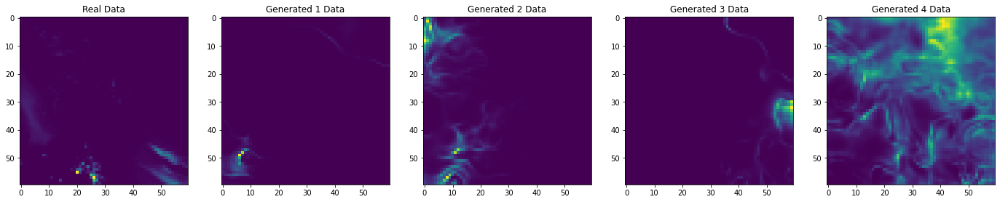

87


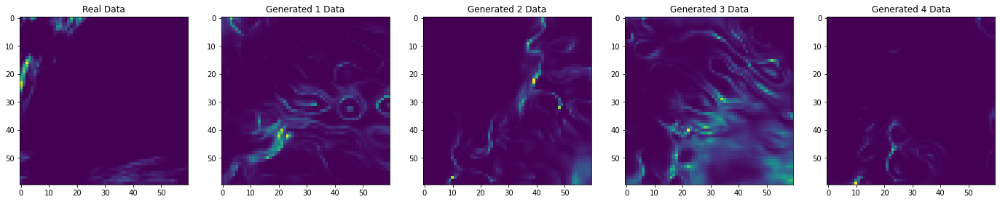

88


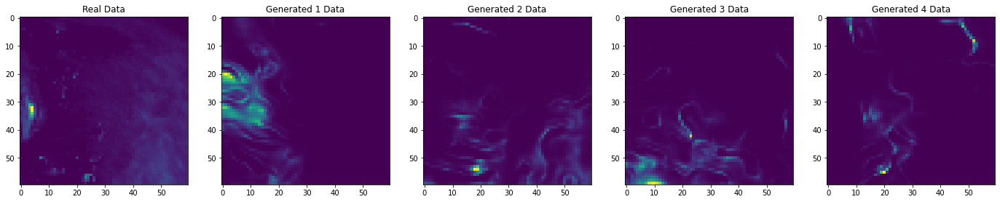

89


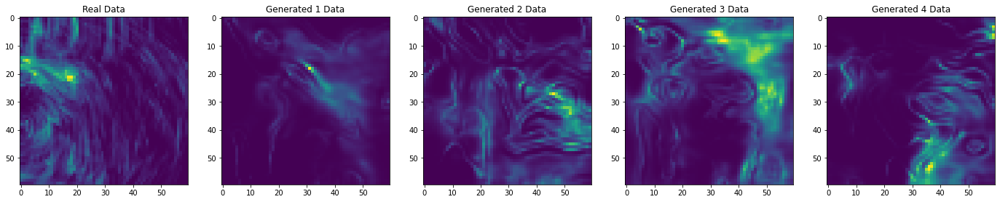

90


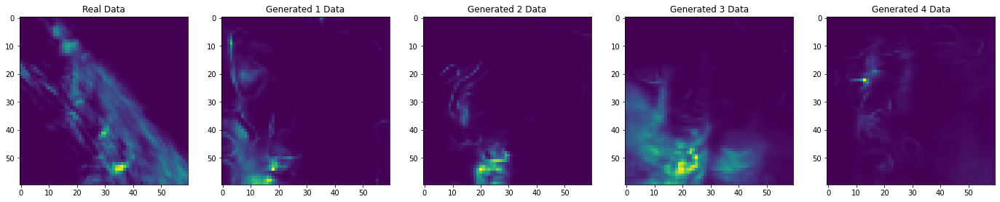

91


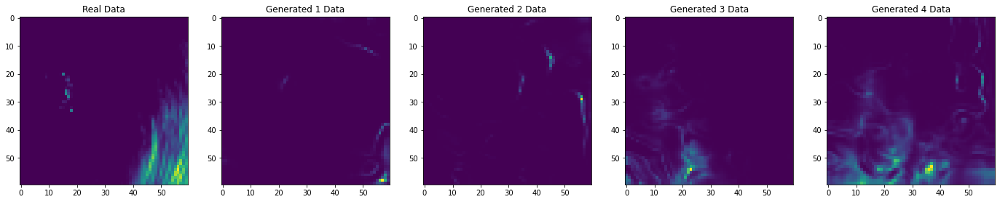

92


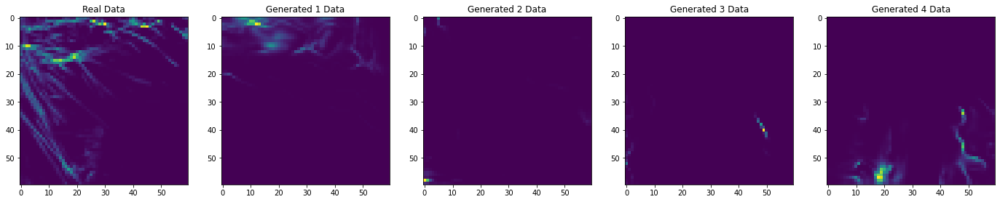

93


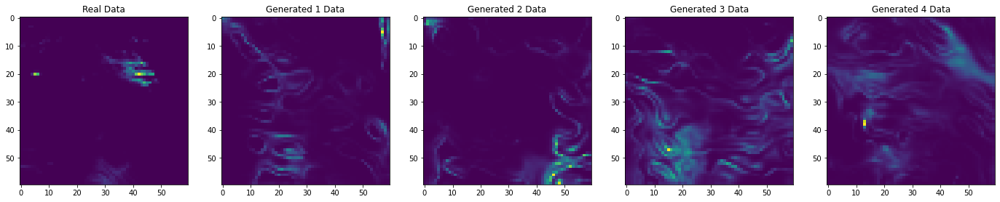

94


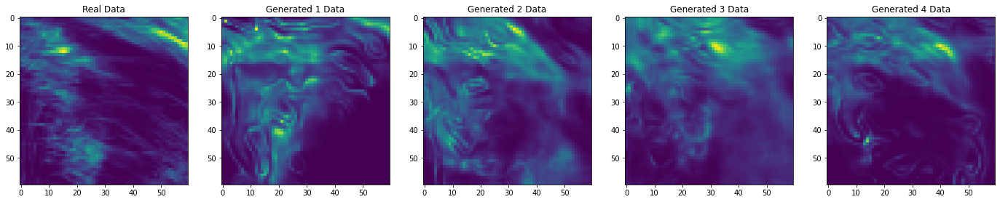

95


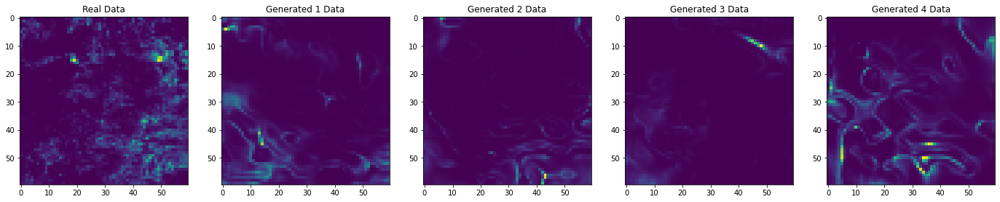

96


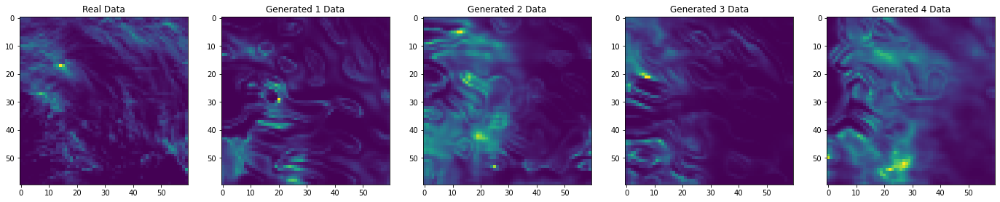

97


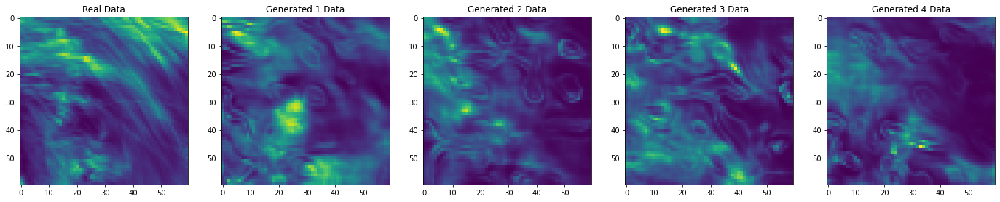

98


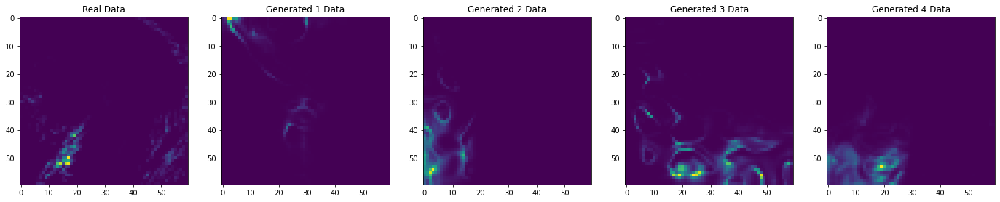

99


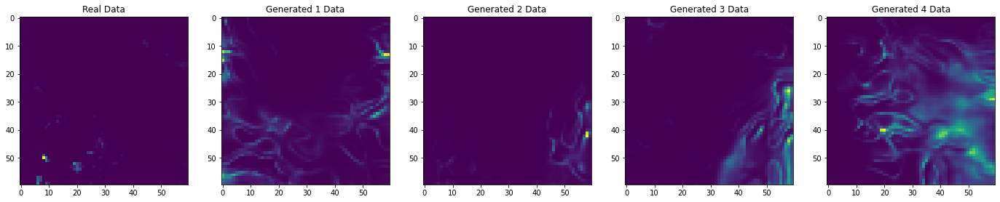

100


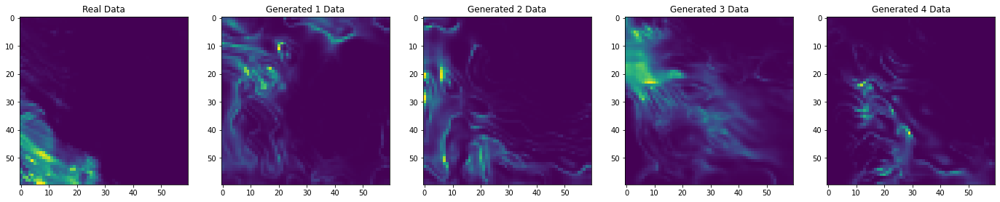

101


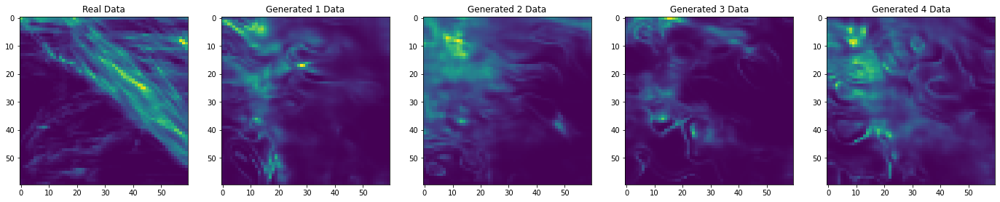

102


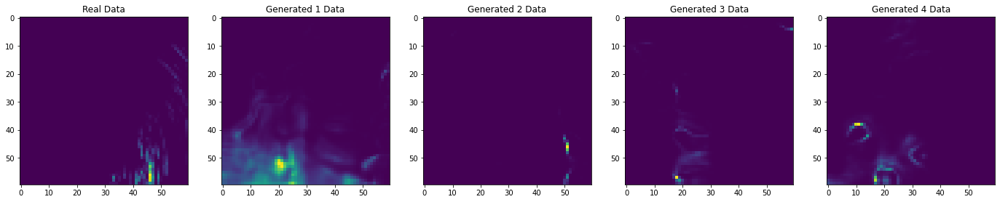

103


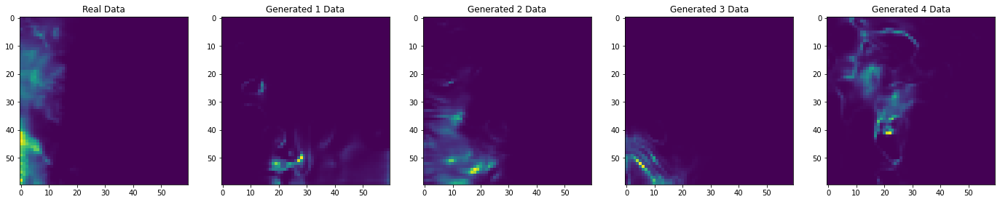

104


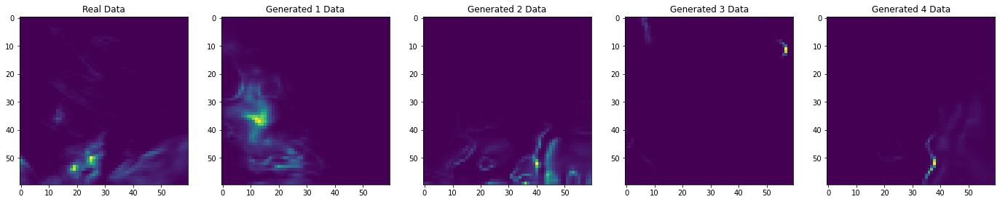

105


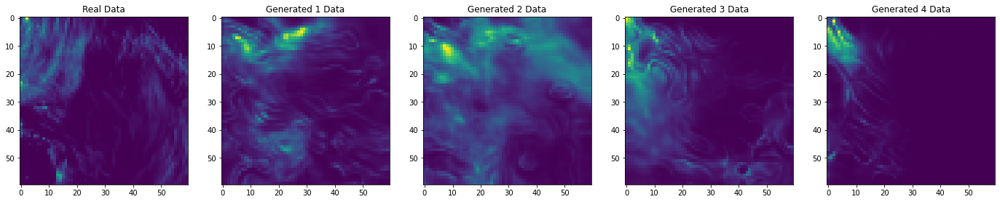

106


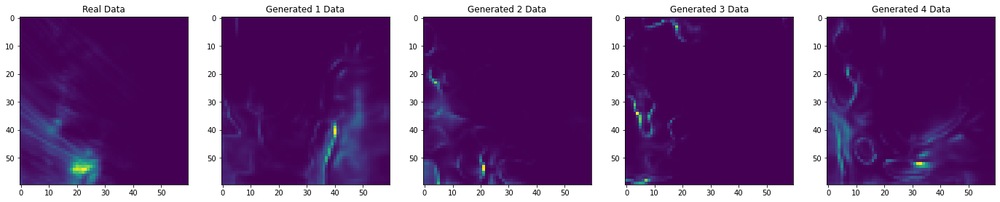

107


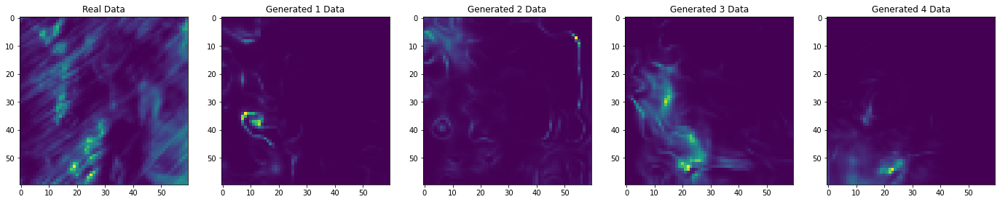

108


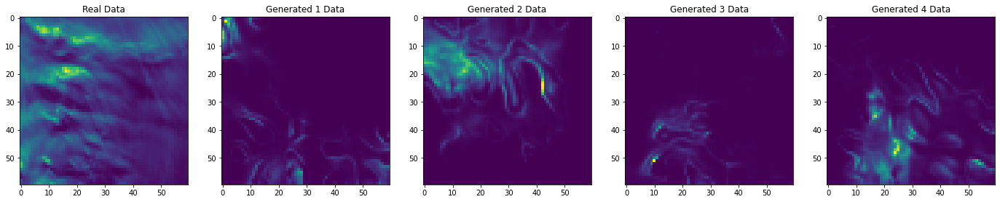

109


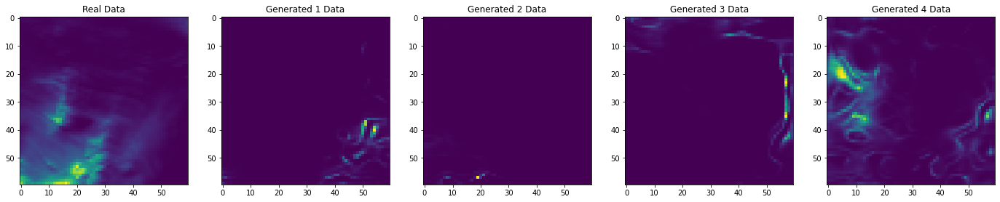

110


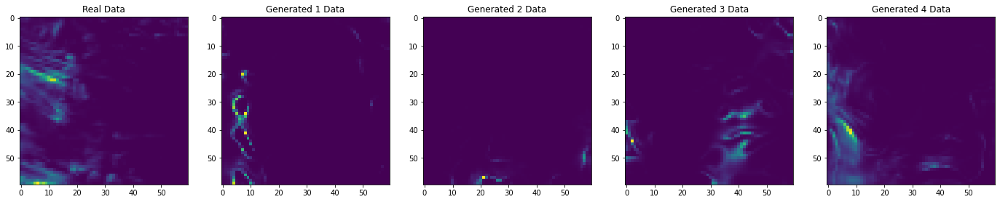

111


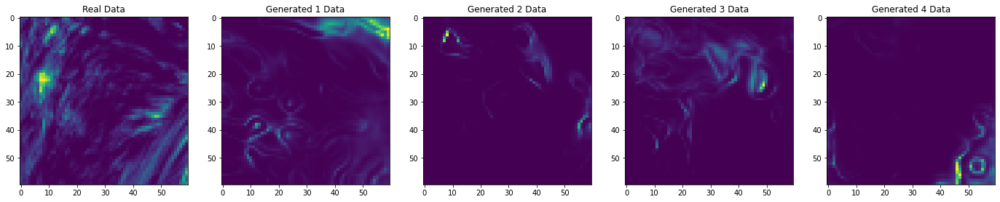

112


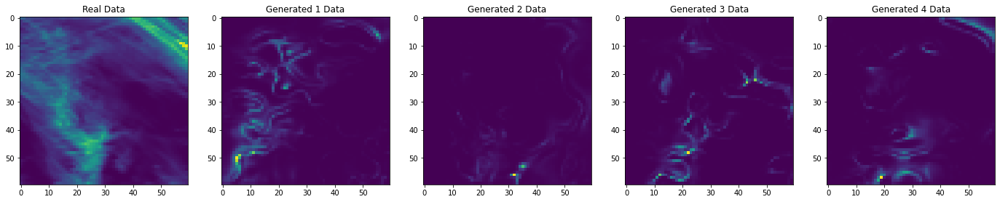

113


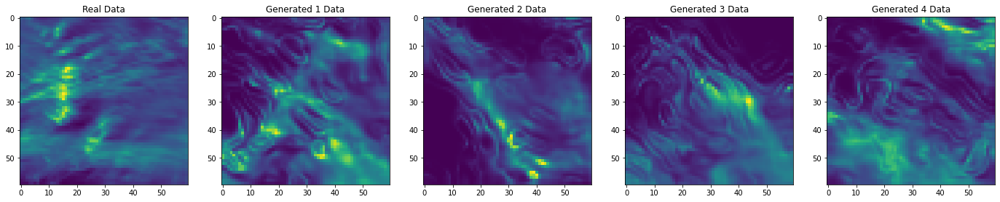

114


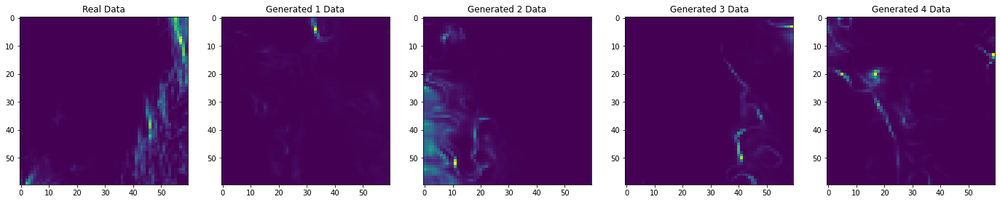

115


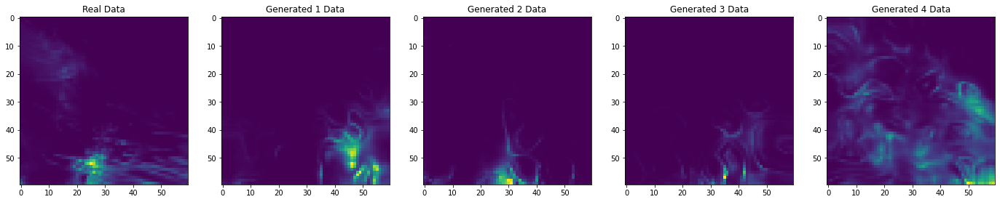

116


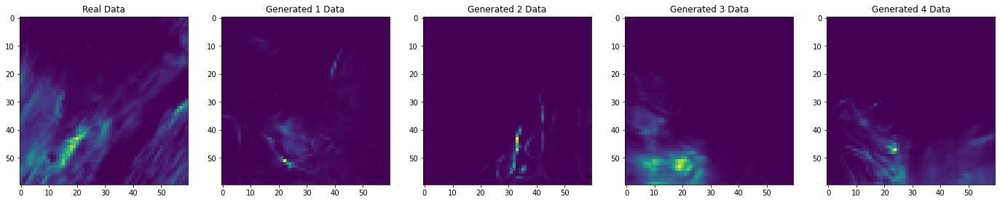

117


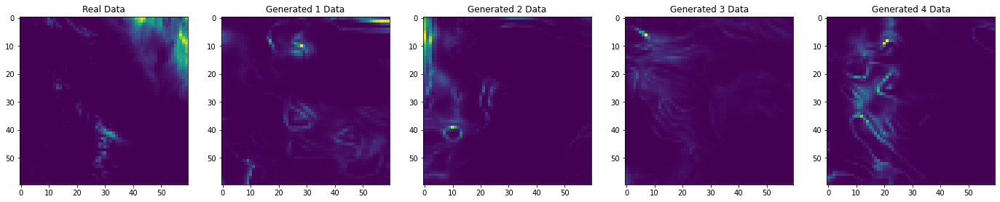

118


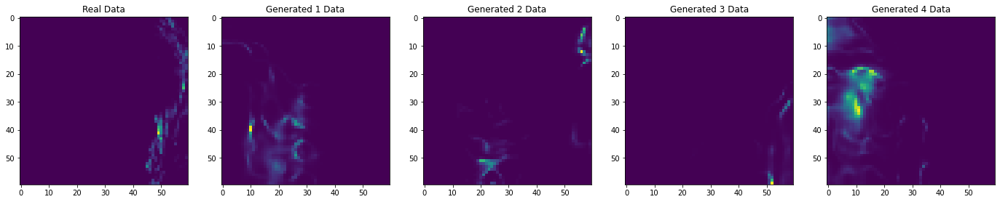

119


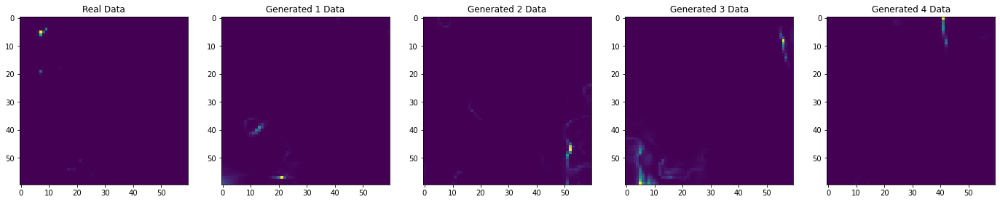

120


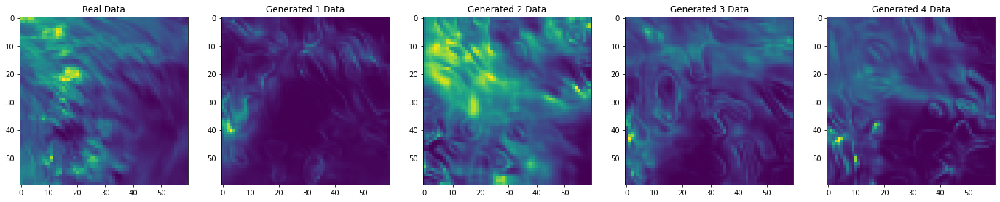

121


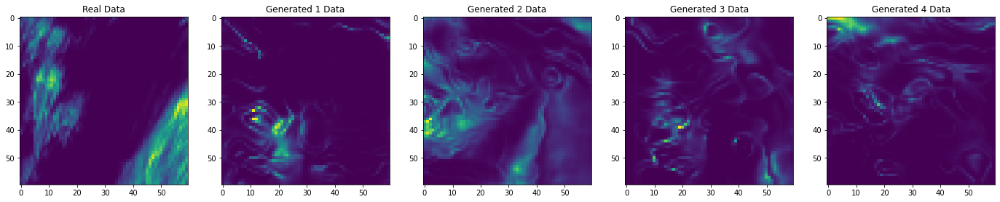

122


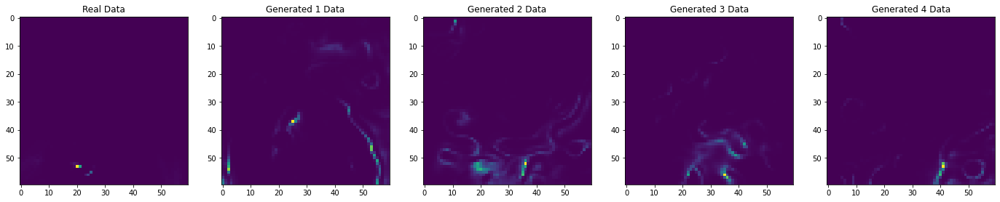

123


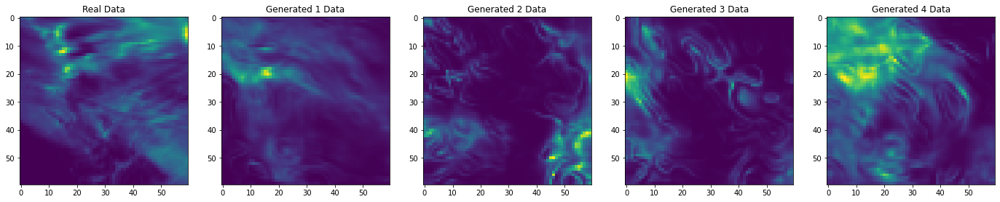

124


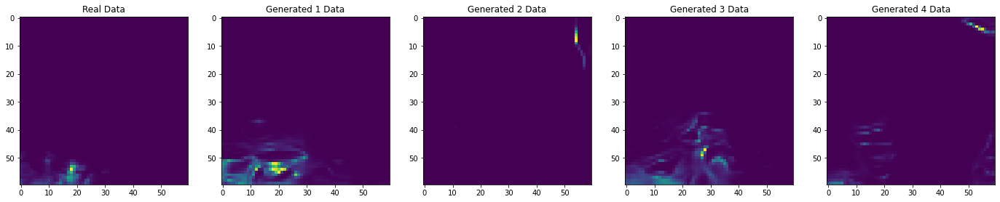

125


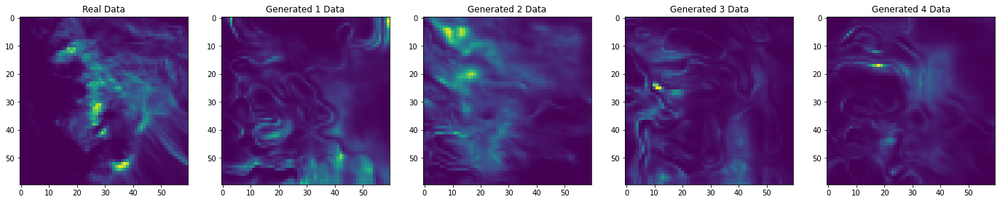

126


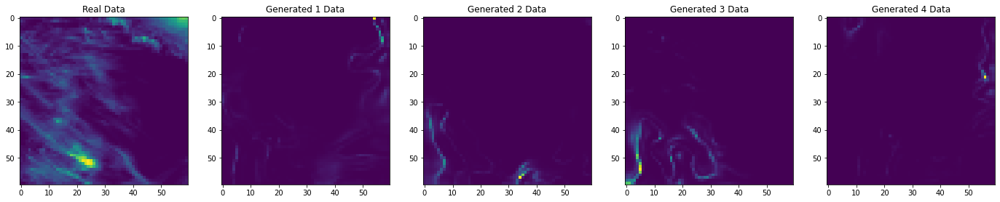

127


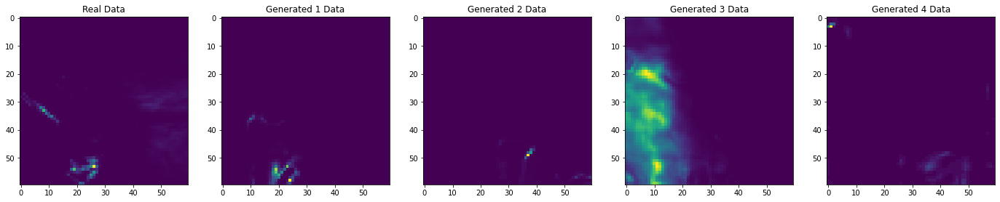

128


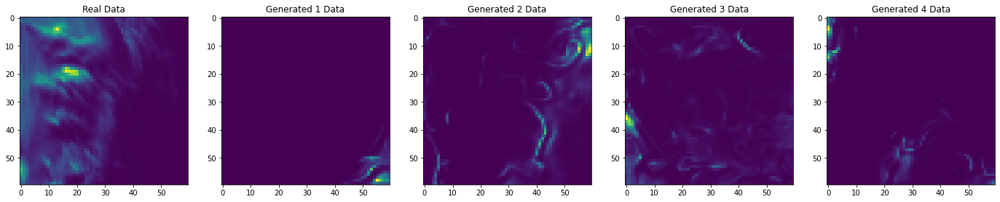

129


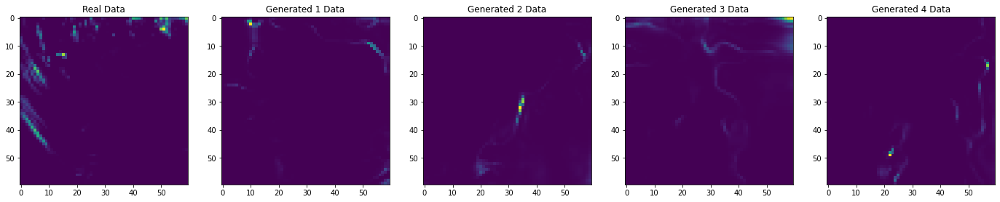

130


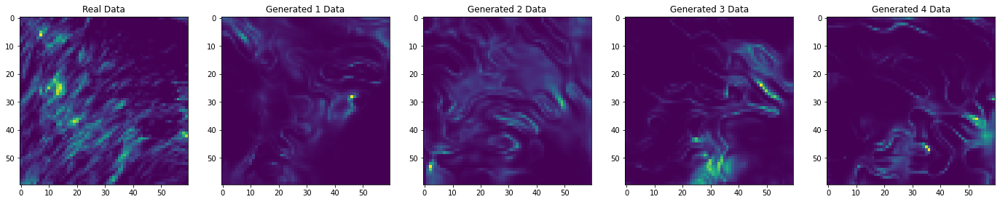

131


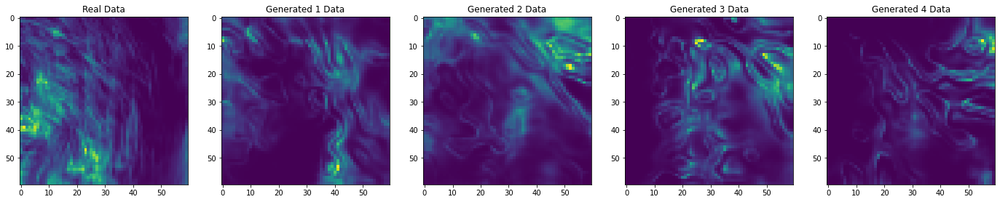

132


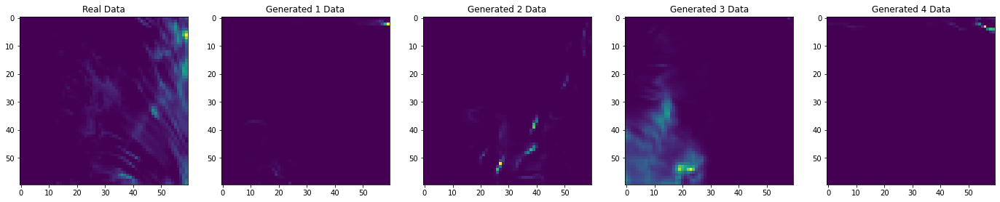

133


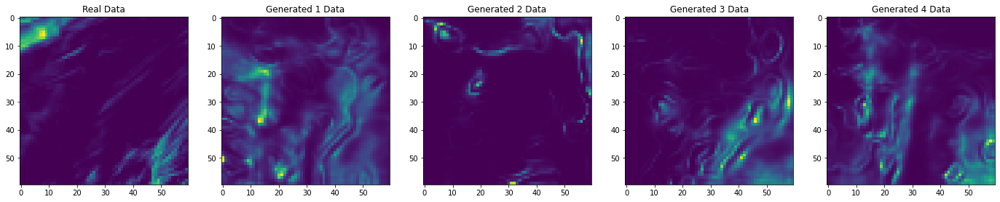

134


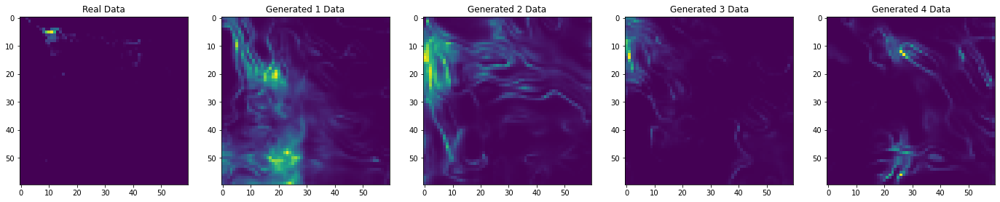

135


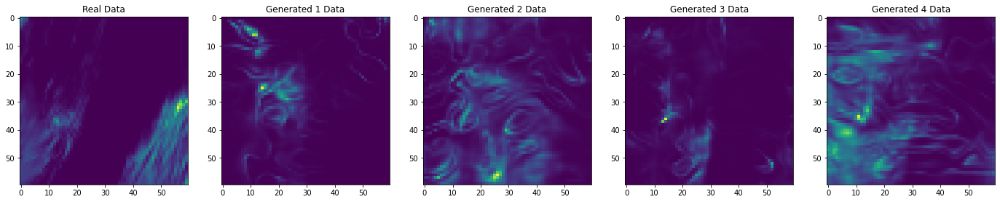

136


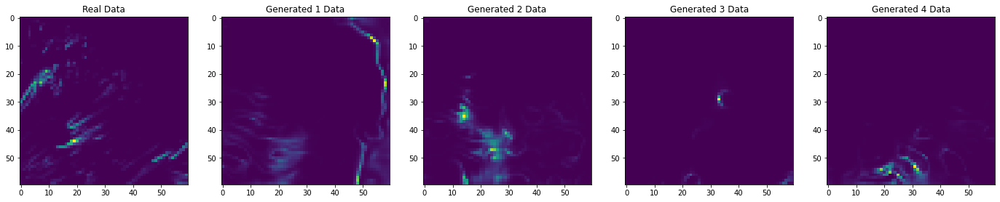

137


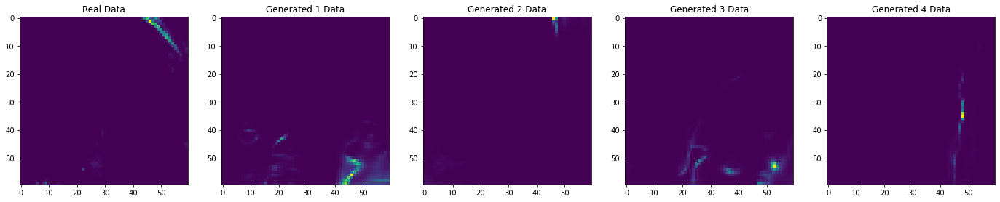

138


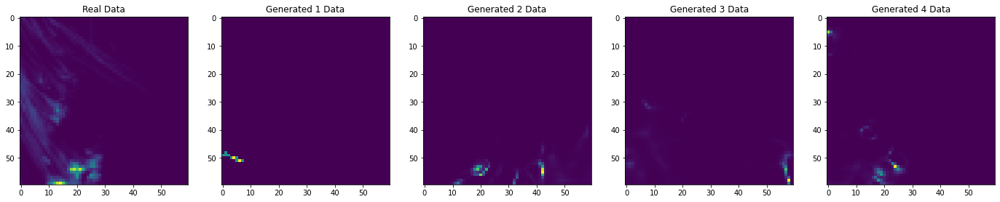

139


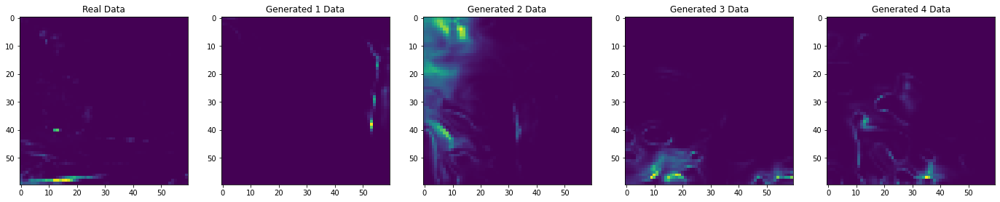

140


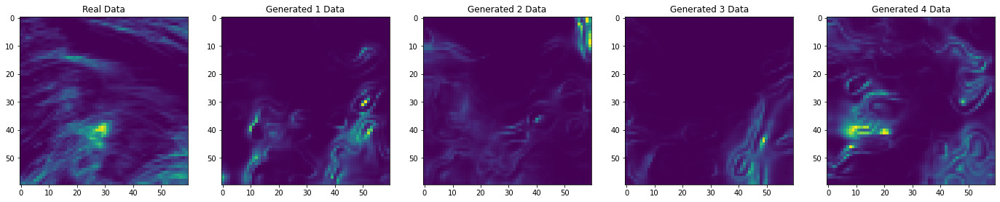

141


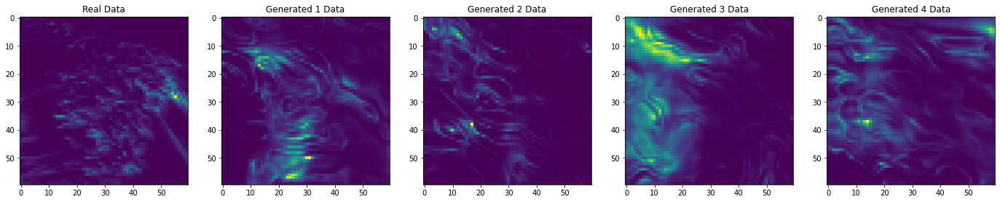

142


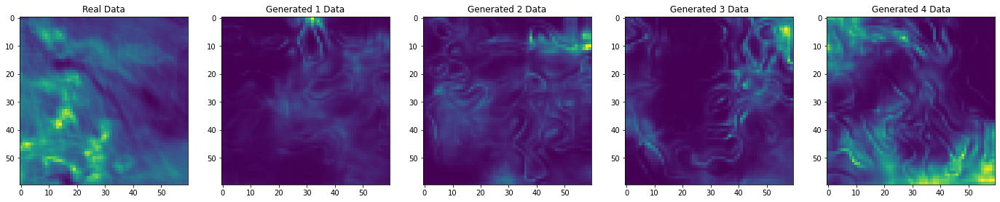

143


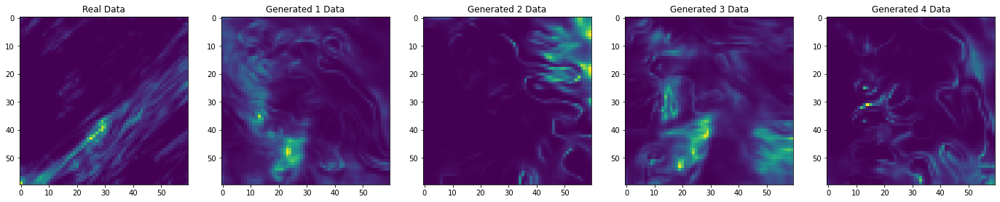

144


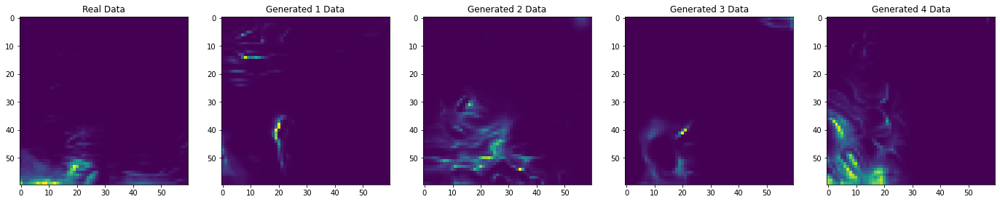

145


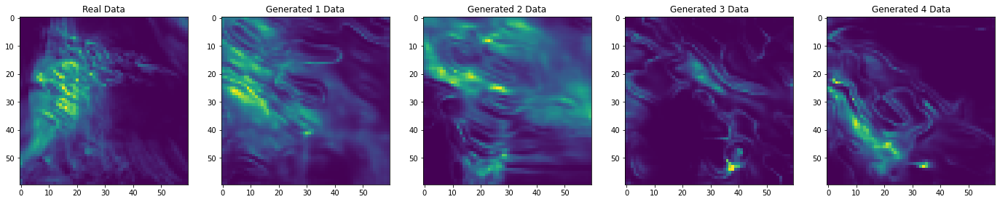

146


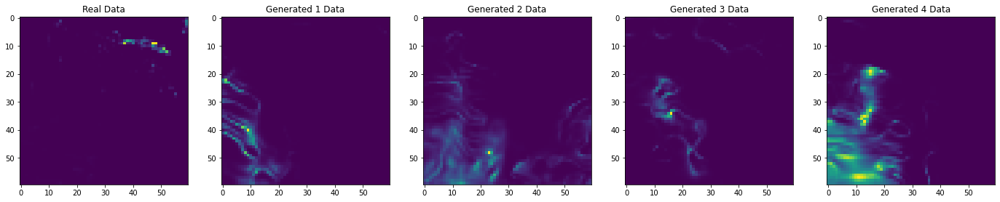

147


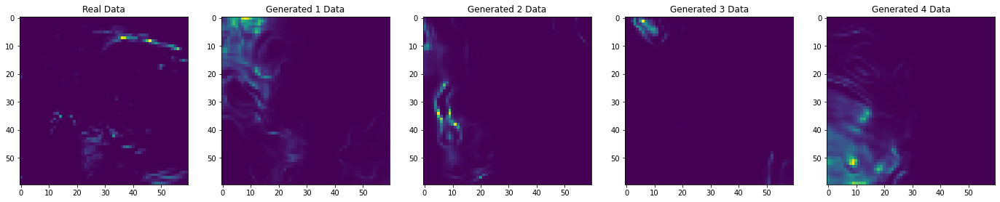

148


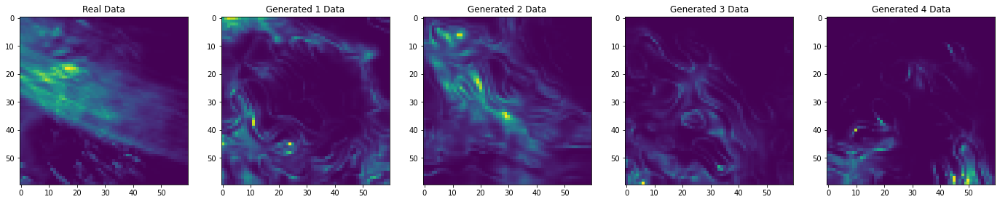

149


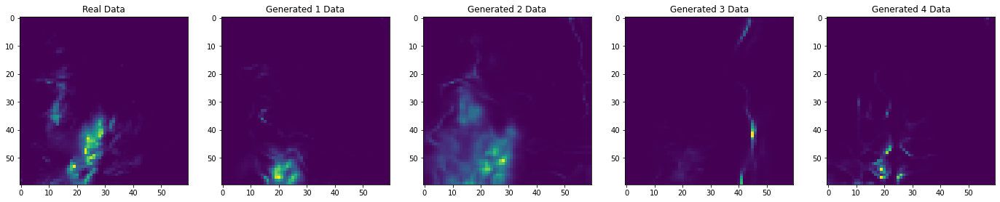

150


KeyboardInterrupt: 

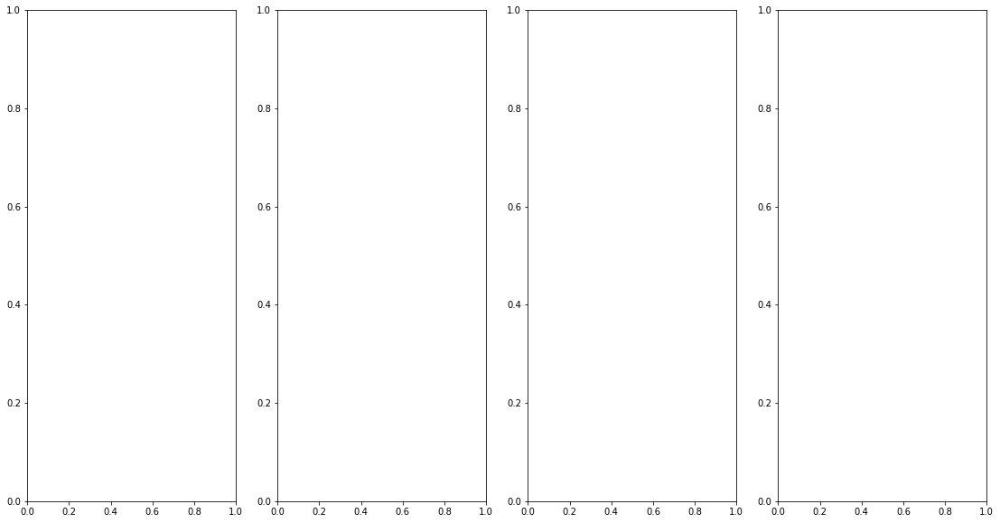

In [4]:
for i in range(4320):
    print(i)
    fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(24, 10))
    axs[0].imshow(real["__xarray_dataarray_variable__"][i])
    axs[0].set_title("Real Data")

    for j in range(4):
        axs[j+1].imshow(gen['__xarray_dataarray_variable__'][i][j])
        axs[j+1].set_title("Generated " + str(j + 1) + " Data")

    plt.show()

In [20]:
rmse = []
for i in range(4320):
    print(i)
    for j in range(4):
        rmse_value = np.sqrt(np.mean((real['__xarray_dataarray_variable__'][i].data - gen['__xarray_dataarray_variable__'][i][j].data) ** 2))
        rmse.append(rmse_value)
        
rmse

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074


3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764


[0.85185766,
 0.81737924,
 0.81773967,
 0.7812427,
 0.47828987,
 0.50191945,
 0.49098322,
 0.4934379,
 0.073125795,
 0.07207962,
 0.06824039,
 0.070665345,
 0.110788755,
 0.105042435,
 0.09081611,
 0.09002316,
 0.0018583803,
 0.0018702811,
 0.0017523458,
 0.025708484,
 0.14082253,
 0.12022595,
 0.12585196,
 0.13904785,
 0.39751127,
 0.32550696,
 0.28924718,
 0.2505785,
 0.100593224,
 0.13843387,
 0.18571891,
 0.13256583,
 0.47561744,
 0.4760326,
 0.476737,
 0.47522268,
 0.3485196,
 0.37255105,
 0.33976406,
 0.5220824,
 0.23082705,
 0.20648496,
 0.2544832,
 0.20565149,
 0.091999814,
 0.108040676,
 0.09245975,
 0.08586628,
 0.107712016,
 0.11341912,
 0.11280367,
 0.110026725,
 0.30380052,
 0.30359256,
 0.3070052,
 0.30367866,
 0.009806412,
 0.013209887,
 0.009760705,
 0.00978719,
 0.639351,
 0.63281715,
 0.63757676,
 0.6388268,
 0.38620734,
 0.38984993,
 0.422115,
 0.36866826,
 0.38582265,
 0.38591582,
 0.3857227,
 0.38599342,
 0.4745447,
 0.5158143,
 0.632047,
 0.4831734,
 0.10315163,
 

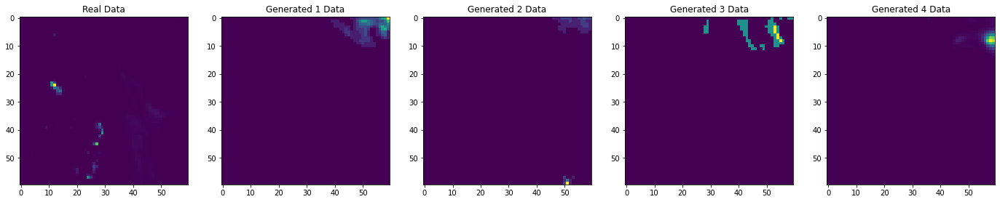

In [27]:
fig, axs = plt.subplots(ncols=5, nrows=1, figsize=(24, 10))
axs[0].imshow(real["__xarray_dataarray_variable__"][1869])
axs[0].set_title("Real Data")

for j in range(4):
    axs[j+1].imshow(gen['__xarray_dataarray_variable__'][1869][j])
    axs[j+1].set_title("Generated " + str(j + 1) + " Data")

plt.show()

## QQ-plots

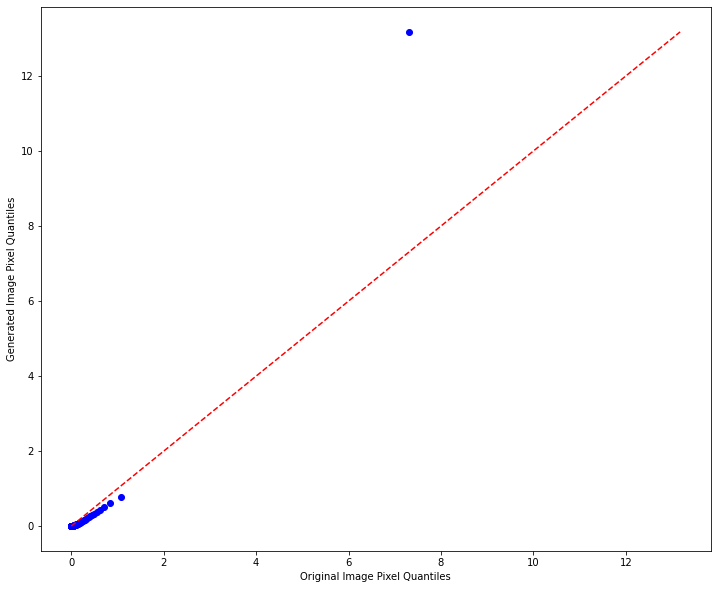

In [11]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

fig, axs = plt.subplots(figsize = (12, 10))

original_images = real["__xarray_dataarray_variable__"].data

generated_images = gen["__xarray_dataarray_variable__"].data
# Flatten the image data into 1D arrays of pixel intensities
original_pixels = original_images.flatten()
generated_pixels = generated_images.flatten()

# Calculate the empirical distributions
original_quantiles = np.percentile(original_pixels, np.linspace(1, 100, 100))
generated_quantiles = np.percentile(generated_pixels, np.linspace(1, 100, 100))

# # CHANGED FROM 100 TO 99
generated_range = np.percentile(generated_pixels, [0, 100])
# generated_quantiles = generated_quantiles[(generated_quantiles >= generated_range[0]) & (generated_quantiles <= generated_range[1])]

# CHANGED FROM ORIGINAL_QUANTILES TO [:-1]
axs.plot(original_quantiles, generated_quantiles, 'o', c = 'b')
axs.plot([generated_range[0], generated_range[1]], [generated_range[0], generated_range[1]], 'r--')
axs.set_xlabel('Original Image Pixel Quantiles')
axs.set_ylabel('Generated Image Pixel Quantiles')


plt.show()

<xarray.Dataset>
Dimensions:                        (x: 60, y: 60)
Coordinates:
  * x                              (x) int64 0 1 2 3 4 5 6 ... 54 55 56 57 58 59
  * y                              (y) int64 0 1 2 3 4 5 6 ... 54 55 56 57 58 59
Data variables:
    __xarray_dataarray_variable__  (x, y) float32 4.537e-05 ... 2.87e-05


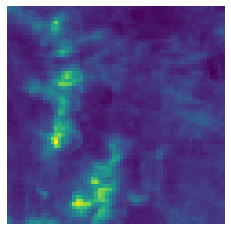

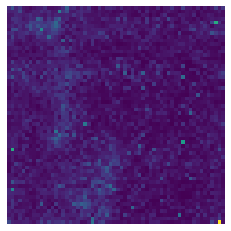

In [6]:
real = xr.open_dataset('data/samples/real_320000.nc')
real_mean = real.mean(dim='original_image')
print(real_mean)

plt.imshow(real_mean['__xarray_dataarray_variable__'].values)
plt.axis('off')
plt.show()

gen = xr.open_dataset('data/samples/gen_320000.nc')
gen_mean = gen.mean(dim=('original_image', 'generated_image'))

plt.imshow(gen_mean['__xarray_dataarray_variable__'].values)
plt.axis('off')
plt.show()

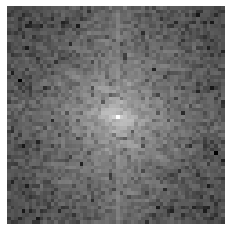

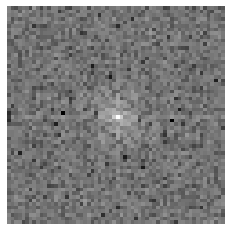

In [136]:
img = real.mean(dim='original_image')['__xarray_dataarray_variable__'].values
img_gray = img

# Perform a Fourier transform on the image
img_fft = np.fft.fft2(img_gray)

# Shift the zero-frequency component to the center of the spectrum
img_fft_shifted = np.fft.fftshift(img_fft)

# Compute the power spectrum
power_spectrum = np.abs(img_fft_shifted)**2

# Plot the power spectrum map
plt.imshow(np.log10(power_spectrum), cmap='gray')
plt.axis('off')
plt.show()

# Load the image into a NumPy array
img = gen.mean(dim=('original_image', 'generated_image'))['__xarray_dataarray_variable__'].values
img_gray = img

# Perform a Fourier transform on the image
img_fft = np.fft.fft2(img_gray)

# Shift the zero-frequency component to the center of the spectrum
img_fft_shifted = np.fft.fftshift(img_fft)

# Compute the power spectrum
power_spectrum = np.abs(img_fft_shifted)**2

# Plot the power spectrum map
plt.imshow(np.log10(power_spectrum), cmap='gray')
plt.axis('off')
plt.show()

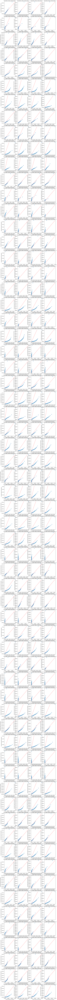

In [3]:
gen = xr.open_dataset('data/samples/gen.nc')
real = xr.open_dataset('data/samples/real.nc')

# # Load some example image data
# original_images = np.random.normal(size=(100, 100))
# generated_images = np.random.normal(size=(100, 100))

# # Flatten the image data into 1D arrays of pixel intensities
# original_pixels = original_images.flatten()
# generated_pixels = generated_images.flatten()

# # Calculate the empirical distributions
# original_quantiles = np.percentile(original_pixels, np.linspace(0, 100, 101))
# generated_quantiles = np.percentile(generated_pixels, np.linspace(0, 100, 101))

# # Create the Q-Q plot
# plt.plot(original_quantiles, generated_quantiles, 'o')
# plt.plot([-3, 3], [-3, 3], 'r--')
# plt.xlabel('Original Image Pixel Quantiles')
# plt.ylabel('Generated Image Pixel Quantiles')
# plt.show()


fig, axs = plt.subplots(ncols=4, nrows = 64, figsize = (16, 320))

for i in range(64):
    original_images = real["__xarray_dataarray_variable__"][i].data    

    for j in range(4):
        generated_images = gen["__xarray_dataarray_variable__"][i][j].data
        # Flatten the image data into 1D arrays of pixel intensities
        original_pixels = original_images.flatten()
        generated_pixels = generated_images.flatten()

        # Calculate the empirical distributions
        original_quantiles = np.percentile(original_pixels, np.linspace(0, 100, 101))
        generated_quantiles = np.percentile(generated_pixels, np.linspace(0, 100, 101))

        generated_range = np.percentile(generated_pixels, [0, 100])
        generated_quantiles = generated_quantiles[(generated_quantiles >= generated_range[0]) & (generated_quantiles <= generated_range[1])]

        max_gen = generated_quantiles.max()

        axs[i][j].plot(original_quantiles, generated_quantiles, 'o')
        axs[i][j].plot([generated_range[0], generated_range[1]], [generated_range[0], generated_range[1]], 'r--')
        axs[i][j].set_xlabel('Original Image Pixel Quantiles')
        axs[i][j].set_ylabel('Generated Image Pixel Quantiles')
        axs[i][j].set_title("Generated " + str(j + 1) + " Data on Real image: " + str(i))

plt.show()

## Rank histograms

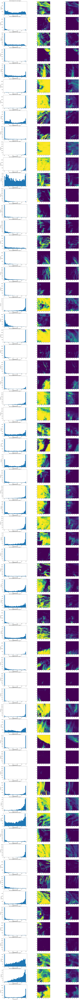

In [4]:
fig, axs = plt.subplots(ncols=3, nrows = 64, figsize = (24, 300))

for i in range(64):
    ground_truth = real["__xarray_dataarray_variable__"][i].data
    predictions = gen["__xarray_dataarray_variable__"][i].data

    # Flatten ground truth and predictions into 1D arrays
    ground_truth_flat = ground_truth.flatten()
    predictions_flat = predictions.flatten()
    num_predictions = predictions_flat.shape[0]

    # Sort the ensemble of predictions in ascending order

    sorted_predictions = np.sort(predictions_flat, axis=0)

    # Determine the position of the actual value in the sorted ensemble of predictions
    position = np.searchsorted(sorted_predictions, ground_truth_flat)

    # Calculate the normalized rank of the actual value compared to all Np predictions
    num_below = position
    normalized_rank = num_below / num_predictions

    # Reshape normalized rank array back to the original image shape
    rank_image = normalized_rank.reshape(ground_truth.shape)

    # Plot histogram of normalized rank values
    axs[i][0].hist(normalized_rank, bins=40, range=(0, 1))
    axs[i][0].set_xlabel('Normalized rank')
    axs[i][0].set_ylabel('Frequency')
    axs[i][0].set_title('Rank histogram for real image ' + str(i))

    axs[i][1].imshow(rank_image)
    axs[i][2].imshow(ground_truth)
plt.show()

## Fractional Skill Score (FSS)

In [78]:
# Converting to binary fields

def generateBinaryFields(generated, real, threshold):
    """
    Compute binary fields for generated and real data using a given threshold.

    Parameters:
        generated (ndarray): Array of generated data.
        real (ndarray): Array of true data.
        threshold (float): Threshold value for binarization.

    Returns:
        tuple: Tuple containing binary fields for generated and real data.
    """
    binary_real = (real >= threshold).astype(int)
    binary_generated = (generated >= threshold).astype(int)
    return binary_generated, binary_real

gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

generated = gen["__xarray_dataarray_variable__"].data
truth = real["__xarray_dataarray_variable__"].data

def fractions_generator(I, n):
    N_x, N_y = I.shape
    O_n = np.zeros((N_x - n + 1, N_y - n + 1))
    for i in range(N_x - n + 1):
        for j in range(N_y - n + 1):
            O_n[i, j] = np.sum(I[i:i + n, j:j + n]) / (n**2)
            
    return O_n


def MSE(O_n, M_n):
    N_x, N_y = O_n.shape
    mse_n = np.sum((O_n - M_n)**2)/(N_x*N_y)
    return mse_n

def MSE_ref(O_n, M_n):
    N_x, N_y = O_n.shape
    mse_n_ref = (np.sum(O_n**2) + np.sum(M_n**2))/(N_x*N_y)
    return mse_n_ref

def FSS(O_n, M_n):
    N_x, N_y = O_n.shape
    mse_n = np.sum((O_n - M_n)**2)/(N_x*N_y)
    mse_n_ref = (np.sum(O_n**2) + np.sum(M_n**2))/(N_x*N_y)
    mse_n_perfect = np.sum((O_n - O_n.mean())**2)/(N_x*N_y)
    fss_n = 1 - mse_n/mse_n_ref

    return fss_n

overall_fss = []

for n in range(1, 14):
    fss = []
    print(n)
    for i in range(20):
        for j in range(4):
#             generated_image = gen['__xarray_dataarray_variable__'][i][j].data * 24 * 3600
#             original_image = real['__xarray_dataarray_variable__'][i].data * 24 * 3600
            generated_image = generated[i][j] * 3600 * 24
            original_image = truth[i] * 3600 * 24
        
            binary_generated, binary_real = generateBinaryFields(generated_image, original_image, 5)

            O_n = fractions_generator(binary_real, 4)
            M_n = fractions_generator(binary_generated, 4)

            mse_n = MSE(O_n, M_n)
            mse_n_ref = MSE_ref(O_n, M_n)
            fss.append(FSS(O_n, M_n))

    overall_fss.append(np.array(fss).mean())
    break

1


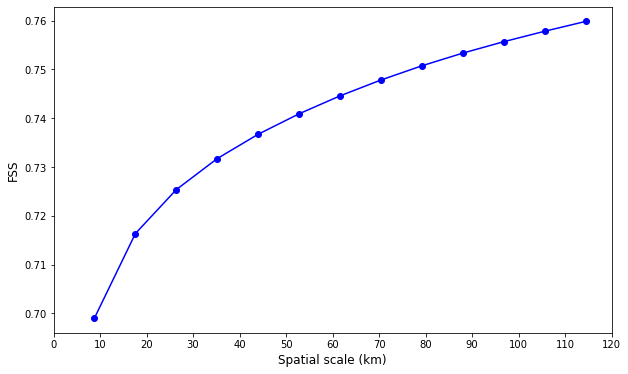

In [77]:
import matplotlib.pyplot as plt
import numpy as np

overall_fss = np.array(overall_fss)
fig, ax = plt.subplots(figsize=(10, 6)) # set figure size

ax.plot(np.arange(1, 14) * 8.8, overall_fss, marker='o', color='b') # plot with markers and color
ax.set_xlabel("Spatial scale (km)", fontsize=12) # set x-label with font size
ax.set_ylabel("FSS", fontsize=12) # set y-label with font size
ax.tick_params(axis='both', which='major', labelsize=10) # set tick label font size

# set xticks to appropriate values
ax.set_xticks([0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120])
# ax.set_xticklabels(['0', '10', '20', '30', '40', '50', '60', '70', '80'])
# ax.set_yticks(np.arange(0.61, 0.69, 0.01))
plt.savefig("fss.png", facecolor = 'white')
plt.show()

In [79]:
overall_fss

[0.6132461436379988]

In [5]:
from scipy.stats import wasserstein_distance
for i in range(64):
    real_image = real["__xarray_dataarray_variable__"][i].data
    for j in range(4):
        generated_image = gen["__xarray_dataarray_variable__"][i][j].data

        # Reshape the images to 1D arrays
        real_image_1d = real_image.reshape((-1,))
        generated_image_1d = generated_image.reshape((-1,))

        # Calculate the Wasserstein distance between the two distributions
        w_distance = wasserstein_distance(real_image_1d, generated_image_1d)

        print("Wasserstein Distance:", w_distance)


Wasserstein Distance: 3.3127190062980592e-06
Wasserstein Distance: 2.320107384576087e-06
Wasserstein Distance: 5.6279705111655446e-06
Wasserstein Distance: 2.5453618164284875e-06
Wasserstein Distance: 1.58987775136821e-05
Wasserstein Distance: 1.0602537430129209e-05
Wasserstein Distance: 1.3807813081086353e-05
Wasserstein Distance: 1.6608411214955686e-05
Wasserstein Distance: 1.6129377611388805e-06
Wasserstein Distance: 7.4288706725399975e-06
Wasserstein Distance: 7.953491975775387e-06
Wasserstein Distance: 2.7363559613988996e-06
Wasserstein Distance: 1.0600843650067507e-05
Wasserstein Distance: 1.2740855736052709e-05
Wasserstein Distance: 7.977933919411766e-06
Wasserstein Distance: 8.082995819115141e-06
Wasserstein Distance: 5.866998987706957e-06
Wasserstein Distance: 8.389417136507011e-06
Wasserstein Distance: 7.112897609349341e-06
Wasserstein Distance: 7.3308821892420135e-06
Wasserstein Distance: 9.521990471005408e-05
Wasserstein Distance: 9.396612714174035e-05
Wasserstein Distance:

In [75]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

generated = gen["__xarray_dataarray_variable__"].data
truth = real["__xarray_dataarray_variable__"].data

def crps_ensemble(observation, forecasts):

    fc = forecasts.copy()
    fc.sort(axis=-1)
    obs = observation
    fc_below = fc < obs[..., None]
    crps = np.zeros_like(obs)

    for i in range(fc.shape[-1]):
        below = fc_below[..., i]
        weight = ((i+1)**2 - i**2) / fc.shape[-1]**2
        crps[below] += weight * (obs[below]-fc[..., i][below])

    for i in range(fc.shape[-1] - 1, -1, -1):
        above = ~fc_below[..., i]
        k = fc.shape[-1] - 1 - i
        weight = ((k+1)**2 - k**2) / fc.shape[-1]**2
        crps[above] += weight * (fc[..., i][above] - obs[above])

    return crps

real_images_selected = truth[np.any(truth > 5, axis=(1, 2))]
generated_images_selected = generated[np.any(truth > 5, axis=(1, 2))]

crps =  []
for sample in  range(20):
#     generated = gen["__xarray_dataarray_variable__"].data[sample]
#     truth = real["__xarray_dataarray_variable__"].data[sample]
    generated = generated_images_selected[sample]
    truth = real_images_selected[sample]

    crps.append(crps_ensemble(truth, generated.reshape((60, 60, 4))))
np.array(crps).mean()

0.48248187

In [74]:
import skimage.util
from tensorflow.keras.layers import MaxPool2D, AvgPool2D

def pool(x, pool_type, data_format='channels_last'):
    """Apply pooling operation (via Tensorflow) to input Numpy array x.
    x should be 4-dimensional: N x W x H x C ('channels_last') or N x C x W x H ('channels_first')
    Pooling is applied on W and H dimensions.

    """
    pool_op = {
        'max_4': MaxPool2D(pool_size=(4, 4), strides=(2, 2), data_format=data_format),
        'max_16': MaxPool2D(pool_size=(15, 15), strides=(5, 5), data_format=data_format),
        'avg_4': AvgPool2D(pool_size=(4, 4), strides=(2, 2), data_format=data_format),
        'avg_16': AvgPool2D(pool_size=(15, 15), strides=(5, 5), data_format=data_format),
    }[pool_type]

    return pool_op(x.astype("float32")).numpy()

generated = gen["__xarray_dataarray_variable__"].data
truth = real["__xarray_dataarray_variable__"].data

real_images_selected = truth[np.any(truth > 5, axis=(1, 2))]
generated_images_selected = generated[np.any(truth > 5, axis=(1, 2))]

truth_pooled = pool(real_images_selected.reshape((20, 60, 60, 1)), 'max_16')
samples_gen_pooled = pool(generated_images_selected.reshape((20, 60, 60, 4)), 'max_16')
# crps_ensemble expects truth dims [N, H, W], pred dims [N, H, W, C]
crps_score = crps_ensemble(np.squeeze(truth_pooled, axis=-1), samples_gen_pooled).mean()

crps_score
# crps.append(crps_score)
# np.array(crps).mean().mean()

1.3340822

In [67]:
import numpy as np

generated_images = gen["__xarray_dataarray_variable__"].data
truth_images = real["__xarray_dataarray_variable__"].data

# assume real_images has shape (4320, 60, 60) and generated_images has shape (4320, 4, 60, 60)
real_images_selected = real_images[np.any(real_images > 5, axis=(1, 2))]
generated_images_selected = generated_images[np.any(real_images > 5, axis=(1, 2))]

print(real_images_selected.shape)
print(generated_images_selected.shape)

(20, 60, 60)
(20, 4, 60, 60)


In [12]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

generated_images = gen['__xarray_dataarray_variable__'].data[:, 0]
real_images = real['__xarray_dataarray_variable__'].data

mae = np.mean(np.abs(real_images - generated_images))

print("MAE:", mae)

MAE: 0.11575282


## RMSE

In [51]:
import numpy as np
import xarray as xr

# Open the datasets
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

# Get the data as numpy arrays
generated_images = gen['__xarray_dataarray_variable__'].data[:, 3]
real_images = real['__xarray_dataarray_variable__'].data

# Apply boolean indexing to filter values in the real_images dataset
real_images_filtered = np.any(real_images > 5, axis=(1, 2))

# Apply the same index to the generated_images dataset
generated_images_filtered = generated_images[real_images_filtered]

# Reshape both arrays into a 2D array where each row represents a single real image and its corresponding 4 generated images
real_images_2d = real_images[real_images_filtered] * 24
generated_images_2d = generated_images_filtered * 24

# Compute the element-wise difference between the flattened real and generated images
diff = real_images_2d - generated_images_2d

# Square the difference array to get the squared error
squared_error = diff ** 2

# Compute the mean of the squared error array
mse = np.mean(squared_error)

# Take the square root of the mean squared error to get the RMSE
rmse = np.sqrt(mse)

print(f"RMSE: {rmse}")

RMSE: 18.26654052734375


In [79]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

generated_images = gen['__xarray_dataarray_variable__'].data[:, 3]
real_images = real['__xarray_dataarray_variable__'].data

# Reshape both arrays into a 2D array where each row represents a single real image and its corresponding 4 generated images
real_images_2d = real_images.reshape(4320, 3600) * 24
generated_images_2d = generated_images.reshape(4320, 3600) * 24

# Compute the element-wise absolute difference between the flattened real and generated images
abs_diff = np.abs(real_images_2d - generated_images_2d)

# Compute the mean of the absolute difference array
mae = np.mean(abs_diff)

print(f"MAE: {mae}")

MAE: 2.790074586868286


In [50]:
import numpy as np
import xarray as xr

# Open the datasets
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')

# Get the data as numpy arrays
generated_images = gen['__xarray_dataarray_variable__'].data[:, 3]
real_images = real['__xarray_dataarray_variable__'].data

# Apply boolean indexing to filter values in the real_images dataset
real_images_filtered = np.any(real_images > 5, axis=(1, 2))

# Apply the same index to the generated_images dataset
generated_images_filtered = generated_images[real_images_filtered]

# Reshape both arrays into a 2D array where each row represents a single real image and its corresponding 4 generated images
real_images_2d = real_images[real_images_filtered] * 24
generated_images_2d = generated_images_filtered * 24

# Compute the element-wise absolute difference between the flattened real and generated images
abs_diff = np.abs(real_images_2d - generated_images_2d)

# Compute the mean of the absolute difference array
mae = np.mean(abs_diff)

print(real_images_2d.shape)
print(f"MAE: {mae}")


(20, 60, 60)
MAE: 11.37643051147461


## MAE

In [7]:
columns = ['psl', 'temp250', 'temp500', 'temp700', 'temp850', 'temp925', 'vorticity250', 'vorticity500', 'vorticity700', 'vorticity850', 'vorticity925']

max = train['target_pr'].data.max()

for column in columns:
    print(train[column].data.max()) 
    y = np.array([train[column][i][2:62, 2:62].coarsen({"grid_latitude": 6, "grid_longitude": 6}).mean().data for i in range(len(train[column].data))])
    y = (max / (y.max() - y.min())) * (y - y.max()) + max # (y - y.min()) / (y.max() - y.min())
    plt.hist(train[column].data.flatten(), bins = 100)
    plt.show()
    plt.hist(y.flatten(), bins = 100)
    plt.show()

NameError: name 'train' is not defined

## Heavy rainfall

In [30]:
gen = xr.open_dataset('data/samples/normal/gen_last.nc')
real = xr.open_dataset('data/samples/normal/real_last.nc')['__xarray_dataarray_variable__'].data

len(real[real > 2.67]) / 4320

1.0018518518518518

In [4]:
ds = xr.open_dataset('data/train.nc')

In [5]:
ds

<xarray.Dataset>
Dimensions:                     (time: 15120, grid_latitude: 64,
                                 grid_longitude: 64, bnds: 2)
Coordinates:
  * time                        (time) object 1980-12-01 12:00:00 ... 2080-11...
  * grid_longitude              (grid_longitude) float32 357.9 358.0 ... 363.0
  * grid_latitude               (grid_latitude) float32 -2.49 -2.41 ... 2.55
    season                      (time) int64 ...
Dimensions without coordinates: bnds
Data variables: (12/16)
    psl                         (time, grid_latitude, grid_longitude) float32 ...
    rotated_latitude_longitude  (time) float64 ...
    grid_latitude_bnds          (time, grid_latitude, bnds) float32 ...
    grid_longitude_bnds         (time, grid_longitude, bnds) float32 ...
    time_bnds                   (time, bnds) object ...
    target_pr                   (time, grid_latitude, grid_longitude) float32 ...
    ...                          ...
    temp925                     (time, grid_latitude, grid_longitude) float32 ...
    vorticity250                (time, grid_latitude, grid_longitude) float64 ...
    vorticity500                (time, grid_latitude, grid_longitude) float64 ...
    vorticity700                (time, grid_latitude, grid_longitude) float64 ...
    vorticity850                (time, grid_latitude, grid_longitude) float64 ...
    vorticity925                (time, grid_latitude, grid_longitude) float64 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.5 (https://mpimet.mpg.de...
    Conventions:  CF-1.7
    source:       Data from Met Office Unified Model
    um_version:   10.6
    CDO:          Climate Data Operators version 2.0.5 (https://mpimet.mpg.de...

In [60]:
from math import *

def rotated_grid_transform(grid_in, option, SP_coor):
    lon = grid_in[0]
    lat = grid_in[1];

    lon = (lon*pi)/180; # Convert degrees to radians
    lat = (lat*pi)/180;

    SP_lon = SP_coor[0];
    SP_lat = SP_coor[1];

    theta = 90+SP_lat; # Rotation around y-axis
    phi = SP_lon; # Rotation around z-axis

    theta = (theta*pi)/180;
    phi = (phi*pi)/180; # Convert degrees to radians

    x = cos(lon)*cos(lat); # Convert from spherical to cartesian coordinates
    y = sin(lon)*cos(lat);
    z = sin(lat);

    if option == 1: # Regular -> Rotated

        x_new = cos(theta)*cos(phi)*x + cos(theta)*sin(phi)*y + sin(theta)*z;
        y_new = -sin(phi)*x + cos(phi)*y;
        z_new = -sin(theta)*cos(phi)*x - sin(theta)*sin(phi)*y + cos(theta)*z;

    else:  # Rotated -> Regular

        phi = -phi;
        theta = -theta;

        x_new = cos(theta)*cos(phi)*x + sin(phi)*y + sin(theta)*cos(phi)*z;
        y_new = -cos(theta)*sin(phi)*x + cos(phi)*y - sin(theta)*sin(phi)*z;
        z_new = -sin(theta)*x + cos(theta)*z;



    lon_new = atan2(y_new,x_new); # Convert cartesian back to spherical coordinates
    lat_new = asin(z_new);

    lon_new = (lon_new*180)/pi; # Convert radians back to degrees
    lat_new = (lat_new*180)/pi;

    # print((lon_new, lat_new))
    return (lon_new, lat_new)

vertex1 = rotated_grid_transform((ds['grid_longitude'].data[0], ds['grid_latitude'].data[0]), 2, (177.5,37.5))
vertex2 = rotated_grid_transform((ds['grid_longitude'].data[0], ds['grid_latitude'].data[59]), 2, (177.5,37.5))
vertex3 = rotated_grid_transform((ds['grid_longitude'].data[59], ds['grid_latitude'].data[0]), 2, (177.5,37.5))
vertex4 = rotated_grid_transform((ds['grid_longitude'].data[59], ds['grid_latitude'].data[59]), 2, (177.5,37.5))

vertex1 = (round(vertex1[0], 2), round(vertex1[1], 2))
vertex2 = (round(vertex2[0], 2), round(vertex2[1], 2))
vertex3 = (round(vertex3[0], 2), round(vertex3[1], 2))
vertex4 = (round(vertex4[0], 2), round(vertex4[1], 2))
print(vertex1)
print(vertex2)
print(vertex3)
print(vertex4)

(1.12, 54.94)
(0.75, 50.22)
(-7.09, 54.91)
(-6.62, 50.19)


In [65]:
for i in range(60):
    for j in range(60):
        if rotated_grid_transform((ds['grid_longitude'].data[i], ds['grid_latitude'].data[j]), 2, (177.5,37.5))[1] > 55:
            print(rotated_grid_transform((ds['grid_longitude'].data[i], ds['grid_latitude'].data[j]), 2, (177.5,37.5)))
        if rotated_grid_transform((ds['grid_longitude'].data[i], ds['grid_latitude'].data[j]), 2, (177.5,37.5))[0] < vertex3[0]:
            print(rotated_grid_transform((ds['grid_longitude'].data[i], ds['grid_latitude'].data[j]), 2, (177.5,37.5)))


(-7.092197580754417, 54.90597948409613)


## Rank histograms

In [ ]:
def plot_rank_histogram_all(rank_files,
                            labels,
                            log_path,
                            N_ranks=101,
                            threshold=False,
                            freq=0.0001,
                            model=None,
                            ablation=False):
    fig, axes = plt.subplots(2, 1, sharex=True, figsize=(6, 3))
    if lead_time is not None:
        if threshold:
            fig.suptitle(f'Rank histograms {model} - top {freq:.2%}')
        else:
            fig.suptitle(f'Rank histograms {model} - all')
    else:
        if threshold:
            fig.suptitle(f'Rank histograms - top {freq:.2%}')
        else:
            fig.suptitle('Rank histograms - all')
    plt.subplots_adjust(hspace=0.15)
    plt.rcParams['font.size'] = '12'
    ls = "solid"

    for (fn_valid, label) in zip(rank_files, labels):
        with np.load(fn_valid) as f:
            ranks = f['ranks']
            if threshold:
                lowres = f['lowres']
                assert ranks.shape == lowres.shape
                thresh = findthresh(lowres, freq).root  # find IFS tp threshold
                ranks = ranks[np.where(lowres > thresh)]  # restrict to these events

        plot_rank_histogram(axes[0], ranks, N_ranks=N_ranks, label=label, linestyle=ls, linewidth=0.75, zorder=2)
        plot_rank_cdf(axes[1], ranks, N_ranks=N_ranks, label=label, linestyle=ls, linewidth=0.75, zorder=2)

    bc = np.linspace(0, 1, N_ranks)
    axes[0].plot(bc, [1./N_ranks]*len(bc), linestyle=':', label="Uniform", c='dimgrey', zorder=0)
    axes[0].set_ylabel("Norm. occurrence")
    ylim = axes[0].get_ylim()
    if threshold and lead_time:
        axes[0].set_ylim((0, 0.1))
    elif lead_time:
        axes[0].set_ylim((0, 0.05))
    else:
        axes[0].set_ylim((0, ylim[1]))
    axes[0].set_xlim((0, 1))
    axes[0].text(0.01, 0.97, "(a)",
                 horizontalalignment='left',
                 verticalalignment='top',
                 transform=axes[0].transAxes)

    axes[1].plot(bc, bc, linestyle=':', label="Ideal", c='dimgrey', zorder=0)
    axes[1].set_ylabel("CDF")
    axes[1].set_xlabel("Normalized rank")
    axes[1].set_ylim(0, 1.1)
    axes[1].set_xlim((0, 1))
    axes[1].text(0.01, 0.97, "(b)",
                 horizontalalignment='left',
                 verticalalignment='top',
                 transform=axes[1].transAxes)
    axes[1].legend(bbox_to_anchor=(1.05, 1.05))

    if lead_time is not None:
        if threshold:
            plt.savefig(os.path.join(log_path,
                                     f"rank-distribution-lead_time-{model}-{freq}.pdf"),
                        bbox_inches='tight')
        else:
            plt.savefig(os.path.join(log_path,
                                     f"rank-distribution-lead_time-{model}.pdf"),
                        bbox_inches='tight')
    elif ablation:
        if threshold:
            plt.savefig(os.path.join(log_path,
                                     f"rank-distribution-ablation-{freq}.pdf"),
                        bbox_inches='tight')
        else:
            plt.savefig(os.path.join(log_path,
                                     "rank-distribution-ablation.pdf"),
                        bbox_inches='tight')
    else:
        if threshold:
            plt.savefig(os.path.join(log_path,
                                     f"rank-distribution-{freq}.pdf"),
                        bbox_inches='tight')
        else:
            plt.savefig(os.path.join(log_path,
                                     "rank-distribution.pdf"),
                        bbox_inches='tight')
    plt.close()

# Testing the input data

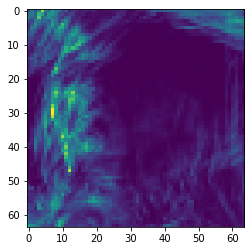

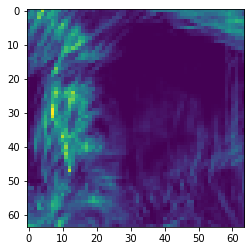

target_pr


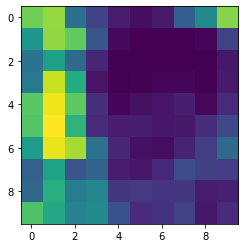

[[2.96435326e-01 3.18826139e-01 1.37883872e-01 7.69308135e-02
  2.90248673e-02 1.47163216e-02 2.79018432e-02 1.13086164e-01
  1.78112179e-01 3.09862077e-01]
 [1.99150041e-01 3.18164229e-01 2.86239058e-01 1.01120144e-01
  8.93573835e-03 1.29070361e-06 1.72375076e-06 6.27900454e-06
  7.07831187e-03 7.29553998e-02]
 [1.43815264e-01 2.15130433e-01 1.31629929e-01 4.01880667e-02
  7.29743333e-04 4.24580241e-04 6.63787214e-05 9.43177962e-04
  2.78162217e-04 2.39955112e-02]
 [1.53898194e-01 3.47479641e-01 2.35474661e-01 2.01529320e-02
  3.80528800e-04 2.22938159e-03 6.80062920e-03 5.13271568e-03
  3.18345323e-04 2.79453248e-02]
 [2.81766355e-01 3.70219857e-01 2.84501165e-01 5.06717823e-02
  4.68759984e-03 1.75541900e-02 2.11763903e-02 3.14637572e-02
  8.14791396e-03 4.49469760e-02]
 [2.78272539e-01 3.79243702e-01 2.46845454e-01 4.66995612e-02
  2.87293997e-02 3.13883163e-02 2.50534713e-02 2.64074393e-02
  4.89990786e-02 8.33257884e-02]
 [2.08243683e-01 3.68120939e-01 3.29242170e-01 1.41686887e

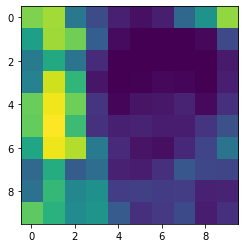

temp250


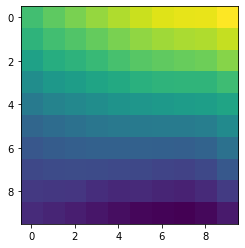

[[788387.8  789538.75 790500.9  791463.06 792288.1  793115.8  793777.5
  794015.8  794113.1  794804.5 ]
 [787333.6  788373.56 789018.2  789811.   790560.1  791274.44 791769.25
  792117.56 792290.56 792904.75]
 [785733.7  786791.75 787269.25 787877.1  788588.   789263.9  789600.5
  789898.94 790082.8  790927.06]
 [783976.25 784899.56 785366.6  785928.06 786482.6  787015.3  787359.6
  787433.6  787490.1  788209.06]
 [782323.75 783034.5  783473.5  783968.75 784434.1  784747.4  785050.2
  785305.4  785491.7  785928.8 ]
 [780580.56 781044.7  781465.3  781862.75 782117.44 782268.75 782394.06
  782375.1  782606.3  783726.75]
 [779313.7  779759.56 779973.94 780145.6  780175.2  780161.8  780090.6
  780005.75 780300.3  781485.8 ]
 [778160.75 778375.2  778458.06 778413.25 778254.2  778128.5  777890.1
  777740.9  778172.   779373.75]
 [777099.25 777014.25 776931.8  776350.94 776012.06 776088.5  775764.6
  775605.75 776057.1  777217.8 ]
 [776143.56 775759.94 775299.3  774821.1  774338.1  773947.7  

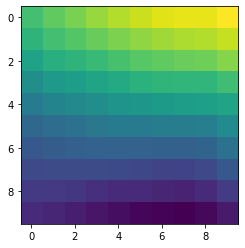

temp500


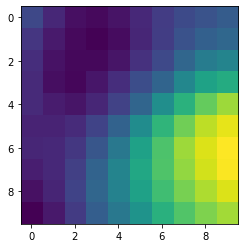

[[875709.94 875045.3  874605.4  874513.4  874683.   875078.5  875485.2
  875757.1  875973.6  876176.75]
 [875345.7  874814.7  874514.44 874399.44 874552.4  875039.8  875508.9
  875928.8  876281.6  876464.75]
 [875182.8  874658.7  874489.6  874485.44 874702.3  875254.1  875748.25
  876435.94 876990.4  877191.  ]
 [875112.9  874589.94 874472.7  874724.44 875181.94 875851.4  876391.56
  877272.56 877975.75 878229.  ]
 [875096.   874831.9  874708.5  875040.2  875591.1  876412.56 877471.75
  878379.1  879161.8  879731.3 ]
 [874975.3  874973.94 875134.75 875610.06 876330.06 877415.4  878485.75
  879290.94 880014.25 880409.06]
 [875036.8  875083.9  875380.2  876044.1  876876.9  877963.94 878904.1
  879729.4  880315.5  880650.6 ]
 [874878.1  875090.8  875558.75 876358.2  877185.56 878118.75 878919.2
  879640.1  880213.8  880621.4 ]
 [874649.2  874995.75 875616.25 876442.44 877147.75 877969.3  878721.06
  879358.25 879875.56 880308.9 ]
 [874354.1  874793.   875453.6  876230.06 876874.1  877578.

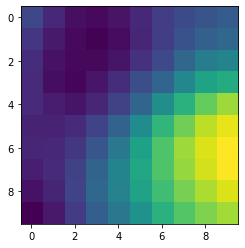

temp700


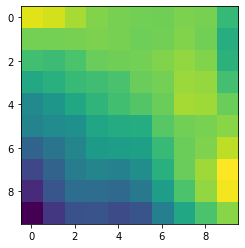

[[943668.56 943596.94 943323.6  943072.   943003.1  942978.4  942964.56
  943038.8  943004.9  942485.3 ]
 [943002.56 942987.9  943011.5  943036.06 943014.3  942943.8  942981.25
  943078.94 942980.7  942271.75]
 [942601.44 942538.6  942683.2  942905.1  942960.8  942992.7  943077.4
  943199.25 943072.   942368.1 ]
 [942201.7  942329.1  942492.06 942582.8  942659.06 942903.4  942995.9
  943248.3  943203.5  942617.2 ]
 [941656.   941883.3  942183.9  942413.4  942587.8  942741.56 942923.4
  943306.8  943283.06 942922.8 ]
 [941523.6  941686.06 941769.56 942129.94 942237.6  942266.5  942779.56
  942970.2  943031.8  943129.56]
 [940996.8  941263.7  941566.56 941942.4  941999.5  942044.44 942503.9
  942928.5  943058.4  943465.  ]
 [940524.8  940972.   941409.25 941570.06 941496.7  941724.44 942326.1
  942907.6  943273.4  943885.  ]
 [940155.4  940760.6  941170.06 941154.4  941075.25 941347.6  942004.7
  942676.4  943187.1  943810.2 ]
 [939622.75 940316.75 940700.5  940726.56 940603.06 940732.  

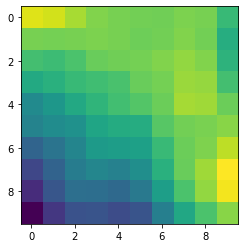

temp850


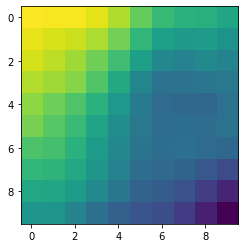

[[977589.9  977527.   977519.6  977304.3  976732.7  975877.2  975257.3
  974984.75 974901.94 974625.5 ]
 [977358.1  977165.56 977022.2  976690.3  976084.94 975160.3  974448.3
  974241.   974356.25 974089.94]
 [977110.6  976872.6  976566.25 976038.25 975376.6  974437.9  973700.
  973577.44 973792.06 973587.06]
 [976768.5  976570.6  976287.2  975626.8  974761.94 973678.7  973113.25
  973129.2  973212.44 973282.2 ]
 [976369.25 975984.5  975599.   974987.06 974231.6  973312.3  972905.2
  972775.6  972801.7  973078.5 ]
 [976113.4  975725.9  975304.25 974596.8  973913.8  973261.   972925.25
  972967.25 972950.9  973093.  ]
 [975582.44 975457.4  974985.56 974353.6  973734.   973138.5  972988.
  973008.56 972887.5  972783.75]
 [975136.5  975068.1  974720.   974183.06 973583.56 972953.06 972835.4
  972709.8  972341.7  972019.56]
 [974669.44 974635.06 974356.25 973811.1  973214.1  972672.56 972494.6
  972199.4  971681.06 971126.8 ]
 [974153.1  974139.25 973610.6  973042.8  972593.7  972277.06 97

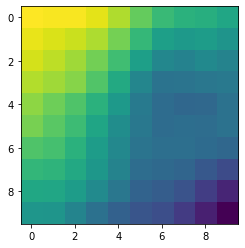

temp925


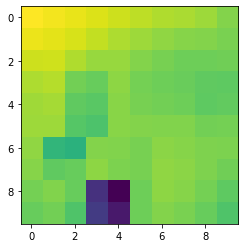

[[995447.9  995083.25 994768.2  994358.6  993838.3  993335.75 992994.
  992811.8  992397.2  991562.56]
 [994854.5  994582.2  994173.2  993531.9  992898.44 992358.44 991955.25
  991671.1  991599.6  991217.5 ]
 [993865.6  993952.   992952.8  992251.1  992199.7  991537.3  991132.5
  990825.3  990816.06 990942.44]
 [992879.3  993099.56 990968.56 990580.5  991913.94 991081.6  990853.
  990635.3  990342.25 990227.  ]
 [992455.   992653.3  990364.3  990062.75 991759.7  991162.56 991007.1
  990834.75 990264.3  990404.6 ]
 [992394.94 992386.56 989895.9  989631.94 991728.4  991580.25 991504.8
  991519.5  991022.4  991089.3 ]
 [991998.3  988326.   987917.75 991562.1  991497.9  991162.   991817.
  991633.7  991421.   991286.2 ]
 [991621.1  990376.5  990619.75 991880.3  991342.2  991176.44 991958.06
  991800.25 991414.25 990933.94]
 [991062.6  991510.2  990576.44 977551.6  974528.8  990834.9  991867.4
  991652.25 991050.5  990273.75]
 [990561.3  990995.1  989657.56 978169.8  975996.4  990832.9  991

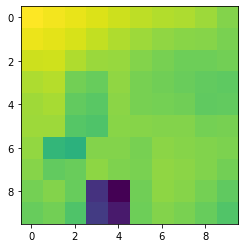

vorticity250


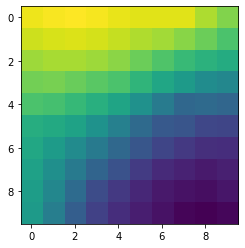

[[ 0.18057182  0.1839399   0.18571129  0.18327286  0.17914015  0.17657913
   0.17683239  0.17650143  0.16088069  0.14707842]
 [ 0.17029529  0.1733719   0.17487498  0.17243389  0.16746434  0.1614744
   0.15705569  0.14916313  0.14017197  0.12798922]
 [ 0.15589098  0.159113    0.15874969  0.15554439  0.15025914  0.139803
   0.12930775  0.11905419  0.11248959  0.1071856 ]
 [ 0.14184964  0.14375161  0.13936427  0.13369343  0.1280955   0.11539891
   0.10234092  0.09248065  0.08049537  0.07587244]
 [ 0.12748445  0.12543783  0.1180768   0.11001422  0.10078516  0.08498342
   0.0662007   0.04997879  0.05174845  0.04895932]
 [ 0.10882799  0.10581493  0.09933327  0.08590886  0.07074337  0.051994
   0.03815237  0.03541722  0.02483877  0.02372838]
 [ 0.10399433  0.09364208  0.07992733  0.06455742  0.05082159  0.03610555
   0.02377055  0.01539983  0.00881314  0.00815755]
 [ 0.09869194  0.08354088  0.06534369  0.04757711  0.03272065  0.01698591
   0.00589069  0.00122037 -0.00359777 -0.00061835]
 [ 0.

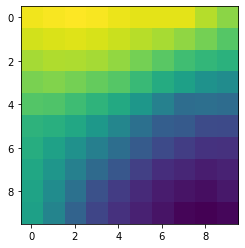

vorticity500


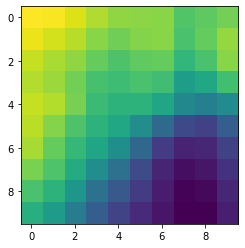

[[ 0.23624778  0.23123387  0.21356977  0.1838977   0.16202565  0.15882266
   0.15773385  0.1166844   0.12563173  0.14409878]
 [ 0.22259441  0.20561866  0.1877536   0.15752516  0.13946107  0.15364395
   0.15678522  0.10906392  0.13175255  0.16618699]
 [ 0.19759695  0.17962193  0.16223933  0.13066937  0.11261892  0.1288068
   0.13148541  0.08578439  0.10907925  0.15793801]
 [ 0.18578611  0.17000241  0.14227199  0.10717233  0.09785608  0.10838645
   0.100451    0.03984244  0.05665879  0.10193873]
 [ 0.19742269  0.1847076   0.14450062  0.09563234  0.08011726  0.07875307
   0.05300168 -0.0005458  -0.01606723  0.00601012]
 [ 0.18976923  0.15410224  0.11235032  0.08016108  0.05767487  0.01128347
  -0.05424006 -0.10965722 -0.12038678 -0.07461853]
 [ 0.17904126  0.13124957  0.08875993  0.0534766   0.01412164 -0.05728519
  -0.12840989 -0.16431437 -0.15866617 -0.12163829]
 [ 0.14762652  0.1139883   0.06618549  0.01081305 -0.04137312 -0.10525588
  -0.1607498  -0.19149674 -0.18052196 -0.14232855]
 

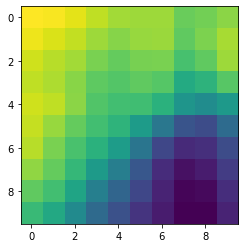

vorticity700


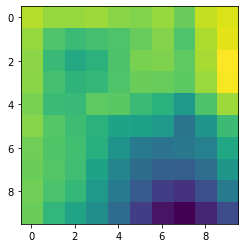

[[ 0.1154518   0.10442315  0.10571758  0.10733512  0.09990214  0.09691043
   0.1059229   0.08840662  0.12000996  0.12872052]
 [ 0.10471839  0.07778689  0.06776208  0.07298059  0.07705313  0.08729838
   0.0984023   0.07692986  0.11254505  0.13170058]
 [ 0.10072461  0.06556027  0.04912632  0.05821284  0.07634554  0.09440044
   0.09661825  0.08374365  0.1113712   0.14140404]
 [ 0.09986054  0.07304425  0.0596588   0.06337268  0.07713543  0.08917725
   0.08689585  0.08304597  0.10686085  0.13920766]
 [ 0.09488968  0.0671907   0.06588116  0.08329904  0.08144817  0.0674862
   0.05746797  0.03374803  0.07621645  0.10777354]
 [ 0.09870683  0.07961354  0.06872756  0.05838927  0.04372309  0.0398291
   0.0341672  -0.00211934  0.03118313  0.06808281]
 [ 0.09083835  0.07826599  0.07142655  0.05433493  0.02875145  0.00483334
  -0.00239385  0.00165641  0.01040827  0.0479465 ]
 [ 0.08875977  0.07877518  0.07002496  0.04386774  0.01464052 -0.00854329
  -0.01966612 -0.02047838 -0.00784875  0.03195896]
 [

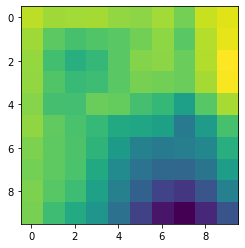

vorticity850


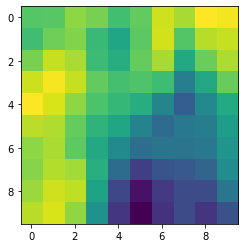

[[ 0.08666181  0.08823126  0.10927279  0.10102953  0.07723846  0.09260703
   0.13286284  0.1187804   0.14953967  0.14563207]
 [ 0.07664751  0.09680138  0.10431763  0.07273863  0.05191482  0.08949556
   0.13360166  0.08595982  0.12379345  0.12860445]
 [ 0.10101809  0.12924156  0.11975366  0.07445752  0.05962037  0.09322864
   0.11899261  0.056423    0.09599688  0.12083133]
 [ 0.13170131  0.14665063  0.1289607   0.09283161  0.07936242  0.08441532
   0.07556312  0.01331792  0.05542515  0.09404661]
 [ 0.14986639  0.13632054  0.10945895  0.0825748   0.07004233  0.06014157
   0.0205299  -0.01778756  0.02322591  0.05696353]
 [ 0.12494549  0.12145211  0.09345677  0.06668581  0.05216418  0.017453
  -0.0054328   0.00760263  0.01245488  0.04454632]
 [ 0.10911901  0.11913352  0.09072115  0.05552924  0.02546639 -0.00267138
   0.00296111  0.00298357  0.00626657  0.03601546]
 [ 0.10686364  0.12202551  0.11686216  0.06201754 -0.00418829 -0.0449627
  -0.02736627 -0.02229746 -0.01113934  0.02768285]
 [ 

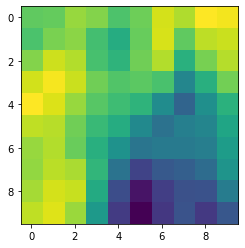

vorticity925


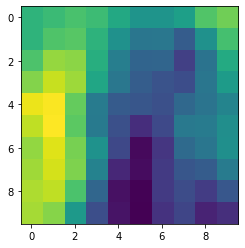

[[ 0.10908009  0.11677071  0.12541142  0.11859137  0.09656589  0.07337113
   0.07316934  0.08624595  0.12953569  0.14451906]
 [ 0.10902645  0.12853017  0.13260519  0.1074312   0.07005568  0.04025023
   0.04130407  0.01318738  0.07056442  0.12385684]
 [ 0.1274951   0.15947412  0.15605855  0.10270657  0.04961161  0.02107591
   0.02263245 -0.01387093  0.03648334  0.098775  ]
 [ 0.15232505  0.17963455  0.16324389  0.09363616  0.04063312  0.01362635
   0.00344523 -0.00205258  0.03947541  0.08132814]
 [ 0.19374933  0.200913    0.13927787  0.04616893  0.01167318  0.00621007
   0.00071272  0.02547182  0.0383686   0.05524403]
 [ 0.17643588  0.20201634  0.134317    0.04570593  0.00023986 -0.02951336
  -0.00590122  0.04315096  0.04659182  0.06740543]
 [ 0.15829046  0.18871484  0.14762275  0.07074495 -0.00678894 -0.05825901
  -0.02291354  0.02779011  0.03957163  0.06816308]
 [ 0.1636026   0.18469929  0.15067306  0.0532286  -0.0350541  -0.05593085
  -0.0196754   0.0061886   0.0132693   0.04598395]


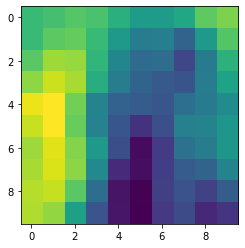

In [27]:
def get_nc(dir_):
    ds = xr.open_dataset(dir_ + "/" + "train.nc", engine='netcdf4')
    # dataarray = xarray.DataArray(convert_to_datetime(ds), coords={'time': ds['time'].values}, dims=['time', 'bnds'])
    # ds['time_bnds'] = dataarray
    return ds

ds = get_nc('../public-downscaling-cgan/data')
i = 0
max = 0.0027274378
plt.imshow(ds['target_pr'][i].data)
plt.show()
plt.imshow(np.log10(1 + ds['target_pr'][i].data * 3600))
plt.show()

columns = ['target_pr', 'temp250', 'temp500', 'temp700', 'temp850', 'temp925', 'vorticity250', 'vorticity500', 'vorticity700', 'vorticity850', 'vorticity925']
for column in columns:
    print(column)
    y = ds[column][i][2:62, 2:62].coarsen({"grid_latitude": 6, "grid_longitude": 6}).mean().data * 3600
    plt.imshow(y)
    plt.show()
    print(y)
    y = np.log10(1 + y)
    print(y)
#     y = (max / (y.max() - y.min())) * (y - y.max()) + max # (y - y.min()) / (y.max() - y.min())
    plt.imshow(y)
    plt.show()

In [23]:
maxValue = np.max(ds['temp250'].data)
y = ds['temp250'][i][2:62, 2:62].coarsen({"grid_latitude": 6, "grid_longitude": 6}).mean().data / maxValue
y

array([[0.9096526 , 0.9109805 , 0.91209066, 0.91320086, 0.9141528 ,
        0.91510785, 0.91587126, 0.9161463 , 0.9162585 , 0.91705626],
       [0.90843624, 0.9096362 , 0.91037995, 0.91129464, 0.912159  ,
        0.9129832 , 0.91355413, 0.91395605, 0.9141556 , 0.91486436],
       [0.9065902 , 0.90781105, 0.908362  , 0.90906334, 0.90988356,
        0.91066337, 0.9110518 , 0.91139615, 0.91160834, 0.91258246],
       [0.9045625 , 0.9056278 , 0.90616673, 0.9068145 , 0.9074544 ,
        0.908069  , 0.9084662 , 0.9085517 , 0.90861684, 0.90944636],
       [0.9026558 , 0.9034759 , 0.9039824 , 0.90455383, 0.90509075,
        0.9054522 , 0.90580165, 0.90609604, 0.90631104, 0.90681535],
       [0.9006445 , 0.90118   , 0.90166533, 0.90212387, 0.9024178 ,
        0.90259236, 0.9027369 , 0.902715  , 0.9029818 , 0.9042746 ],
       [0.8991828 , 0.89969724, 0.89994454, 0.90014267, 0.90017676,
        0.9001613 , 0.90007925, 0.89998126, 0.9003211 , 0.901689  ],
       [0.8978525 , 0.8980999 , 0.8981955

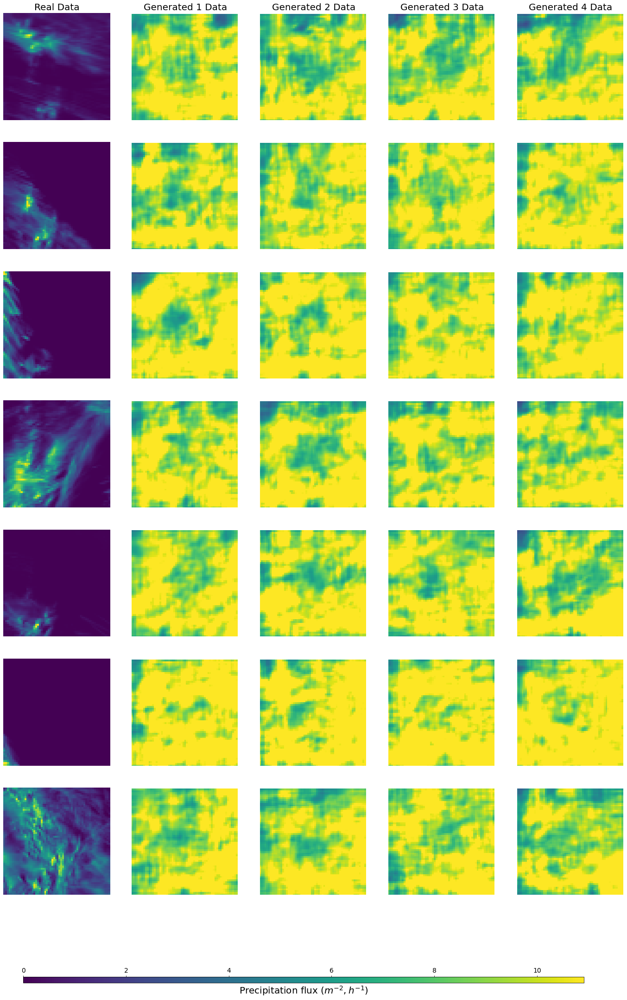

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

real = xr.open_dataset('data/samples/normal/real.nc')
gen = xr.open_dataset('data/samples/normal/gen.nc')


images = [1246, 1852, 2183, 2942, 3022, 3098, 4200]
index = 0

fig, axs = plt.subplots(ncols=5, nrows=7, figsize=(24, 35))
axs[index][0].set_title("Real Data", fontsize=20)
axs[index][1].set_title("Generated 1 Data", fontsize=20)
axs[index][2].set_title("Generated 2 Data", fontsize=20)
axs[index][3].set_title("Generated 3 Data", fontsize=20)
axs[index][4].set_title("Generated 4 Data", fontsize=20)

# Plot real data in the first column and store the min and max values
vmin = np.inf
vmax = -np.inf
for i in images:
    real = xr.open_dataset('data/samples/normal/real.nc')
    im = axs[index][0].imshow(real["__xarray_dataarray_variable__"][i])
    axs[index][0].axis('off')
    vmin = min(vmin, np.min(real["__xarray_dataarray_variable__"][i] * 5))
    vmax = max(vmax, np.max(real["__xarray_dataarray_variable__"][i] * 5))
    index += 1
    if index == len(axs):
        break

# Plot generated data in the remaining columns
index = 0
for i in images:
    for j in range(4):
        im = axs[index][j+1].imshow(gen['__xarray_dataarray_variable__'][i][j], vmin=vmin, vmax=vmax)
        axs[index][j+1].axis('off')
        axs[index][j+1].set_aspect('equal')
        axs[index][j+1].set_xlim([0, 60])
        axs[index][j+1].set_ylim([0, 60])
    index += 1
    if index == len(axs):
        break

# Add color bar for real data
cax = fig.add_axes([0.15, 0.05, 0.7, 0.005])
cbar = plt.colorbar(im, cax=cax, orientation='horizontal')
cbar.ax.tick_params(labelsize=14)
cax.tick_params(axis='x', labelsize=14)
cax.xaxis.set_ticks_position('top')
cax.xaxis.set_label_position('bottom')
cax.set_xlabel('Precipitation flux ($m^{-2}, h^{-1}$)', fontsize=20)

plt.savefig('generated_samples.png', facecolor='white', transparent=False)

In [10]:
real = xr.open_dataset('data/samples/normal/real.nc')["__xarray_dataarray_variable__"].data.max()
real

7.3078175

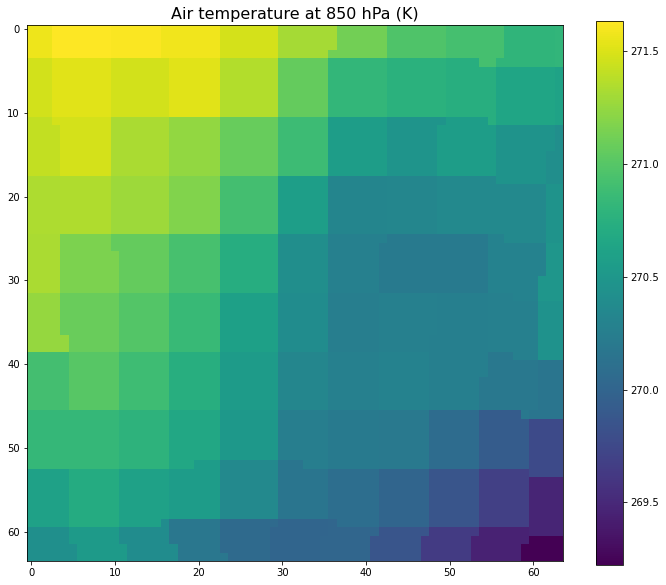

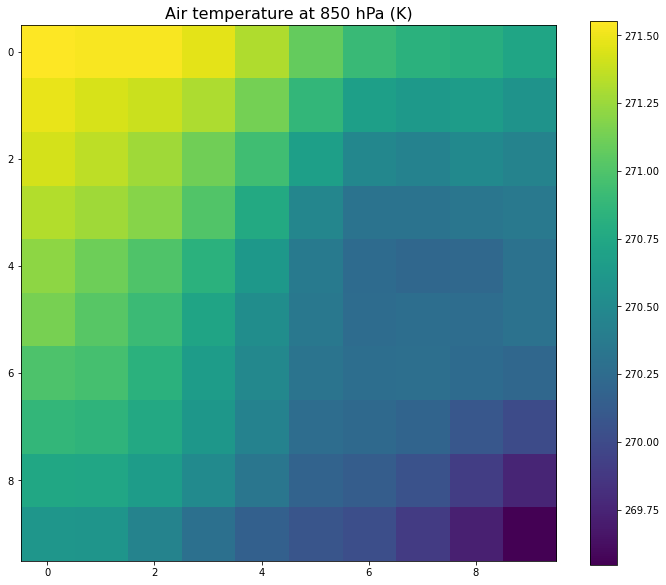

In [17]:
import matplotlib.pyplot as plt
import xarray as xr

def get_nc(dir_):
    ds = xr.open_dataset(dir_ + "/" + "train.nc", engine='netcdf4')
    return ds

ds = get_nc('../public-downscaling-cgan/data')

columns = ['target_pr', 'temp250', 'temp500', 'temp700', 'temp850', 'temp925', 'vorticity250', 'vorticity500', 'vorticity700', 'vorticity850', 'vorticity925']
x = ds['temp850'][0].data
fig, ax = plt.subplots(figsize=(12, 10))
im = ax.imshow(x)
ax.set_title("Air temperature at 850 hPa (K)", fontsize =16)
fig.colorbar(im)
plt.savefig("before_coarsened.png",  facecolor = 'white')
plt.show()

y = ds['temp850'][0][2:62, 2:62].coarsen({"grid_latitude": 6, "grid_longitude": 6}).mean().data
fig, ax = plt.subplots(figsize=(12, 10))
im = ax.imshow(y)
fig.colorbar(im)
ax.set_title("Air temperature at 850 hPa (K)", fontsize = 16)
plt.savefig("after_coarsened.png",  facecolor = 'white')
plt.show()

## QQ plots during training

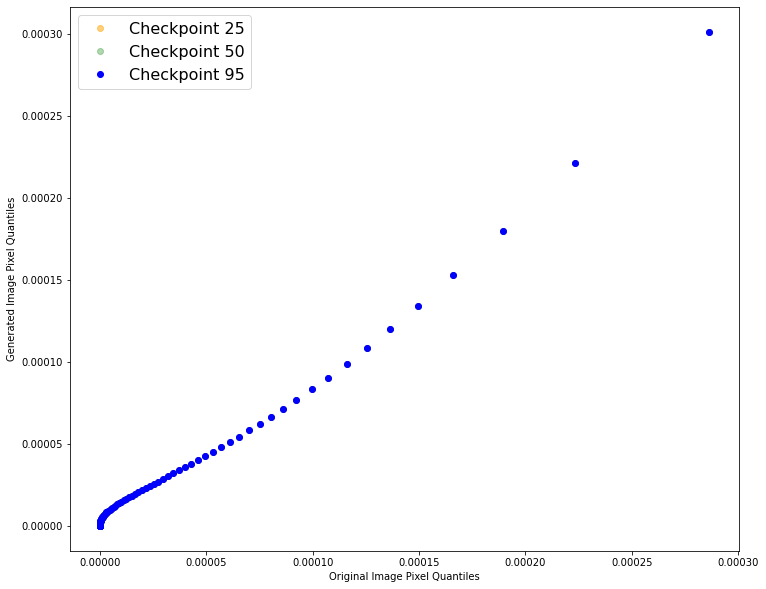

In [64]:
gen = xr.open_dataset('data/samples/gen_normalised_rainfall.nc')
real = xr.open_dataset('data/samples/real_normalised_rainfall.nc')

fig, axs = plt.subplots(figsize = (12, 10))

original_images = real["__xarray_dataarray_variable__"].data

generated_images = gen["__xarray_dataarray_variable__"].data
# Flatten the image data into 1D arrays of pixel intensities
original_pixels = original_images.flatten()
generated_pixels = generated_images.flatten()

# Calculate the empirical distributions
original_quantiles = np.percentile(original_pixels, np.linspace(1, 99, 100))
generated_quantiles = np.percentile(generated_pixels, np.linspace(1, 99, 100))

# # CHANGED FROM 100 TO 99
generated_range = np.percentile(generated_pixels, [0, 99])
# generated_quantiles = generated_quantiles[(generated_quantiles >= generated_range[0]) & (generated_quantiles <= generated_range[1])]

# CHANGED FROM ORIGINAL_QUANTILES TO [:-1]
axs.plot(original_quantiles, generated_quantiles, 'o', c = 'orange', alpha = 0.5, label = "Checkpoint 25")
axs.plot(original_quantiles, generated_quantiles, 'o', c = 'g', alpha = 0.3, label  = "Checkpoint 50")
axs.plot(original_quantiles, generated_quantiles, 'o', c = 'b', label = "Checkpoint 95")
# axs.plot([generated_range[0], generated_range[1]], [generated_range[0], generated_range[1]], 'r--')
axs.set_xlabel('Original Image Pixel Quantiles')
axs.set_ylabel('Generated Image Pixel Quantiles')
# axs.axis(False)
plt.legend(fontsize = 16)

plt.savefig('checkpoint75.png', transparent = True)
plt.show()